In [1]:
import pandas as pd
from sklearn.utils import shuffle
import numpy as np
import umap
import matplotlib.pylab as plt
from matplotlib import colors, cm

plt.rcParams['font.size'] = 18

In [2]:
reference = pd.read_csv('../../physical_properties.csv')

In [3]:
#Set seed
SEED = 0

#Plot a single UMAP of x with color c
def create_umap(x, n_neighbors=50, min_dist=0.1, n_components=2, metric='euclidean'):
    fit = umap.UMAP(
        n_neighbors=n_neighbors,
        min_dist=min_dist,
        n_components=n_components,
        metric=metric,
        densmap=False,
        random_state=SEED
    )
    u = fit.fit_transform(x);
    
    return np.array(u)

def get_umap(basePath, suffix='', n_neighbors=100, min_dist=0.5):
    with open(basePath+'postprocessing/representation%s.npy' % suffix, 'rb') as f:
        rep = np.load(f)
    u = create_umap(rep, n_neighbors=n_neighbors, min_dist=min_dist)
    return u

In [4]:
def add_data(df, reference=reference):
    allkeys = reference.keys()
    for key in allkeys:
        # print(key)
        if key not in df.keys():
            # print('adding', key)
            ncol = len(df.keys())
            df.insert(ncol, key, np.zeros(len(df)))
            index = [i for i in df.index]
            for i in index:
                mask = (reference['snapshot_id'] == df['snapshot_id'][i]) * (reference['subhalo_id'] == df['subhalo_id'][i])
                df[key].values[index.index(i)] = reference[key].values[mask][0]
                
def log_columns(df):
    for column in df.columns:
        if ('mass' in column) or ('00c' in column) or ('accr' in column) or ('inj' in column) or ('sfr') in column:
            if 'd_' not in column:
                val0 = df[column].values
                df[column] = np.log10(val0)


In [5]:
label_raw_dict = {'z': 'Redshift',
                    'm200c': r'M$_{200c}$ [$M_\odot$]', 
                    'stellar_mass': r'$M_*$ [$M_\odot$]',
                    'gas_mass': r'$M_{gas}$ [$M_\odot$]',
                    'bh_mass': r'$M_\bullet$ [$M_\odot$]',
                    # 'm500c': r'M$_{500c}$ [$M_\odot$]', 
                    'bh_accr': r'BHAR [$M_\odot/Gyr$]',
                    # 'bh_einj_cum': r'$E_{inj, cum} (Tot)$ [erg]',
                    'bh_tinj_cum': r'$E_{therm, cum} $ [erg]', 
                    'bh_kinj_cum': r'$E_{kin, cum}$ [erg]', 
                    'sfr': r'SFR [$M_\odot/yr$]',
                    'time_since_last_major_merger': r't$_{merge, FoF}$ (R > 0.2)', 
                    'sublink_tmerge_major': 't$_{merge, BCG}$',
                    'centralCoolingTime': r't$_{cool,c}$ (Gyr)',
                    'central_ne': r'$n_e ( r = 0)$',
                    'slope_ne': r'$\alpha_e (r = 0)$',
                    'Cphys': r'$C_{\rm phys}$'}

label_raw_list = [key for key in label_raw_dict.keys()]
print(len(label_raw_list))

15


In [6]:
label_human_dict = {'z': 'Redshift',
                    'm200c': r'M$_{200c}$ [$M_\odot$]', 
                    'f_star': r'$M_*/M_{200c}$',
                    'f_gas': r'$M_{gas}/M_{200c}$',
                    'd_bh_mass': r'$M_\bullet/M_{200c}$',
                    'f_Edd': r'$\lambda_{Edd}$',
                    'd_bh_tinj_cum': r'$E_{therm, cum} (M_{200c})$', 
                    'd_bh_kinj_cum': r'$E_{kin, cum}(M_{200c})$', 
                    'ssfr': r'sSFR',
                    'Cscale': r'$C_{\rm scale}$',
                    'd_Lx_r200c': '$\Delta L_X (< r_{200c})$',
                    'Mass_Criterion': '$M_{FirstSub}/M_{FoF}$',
                    'Distance_Criterion': 'COM Offset'}

label_list = [key for key in label_human_dict.keys()]
print(len(label_list))

13


In [15]:
df = pd.read_csv('../../fiducial/dataset/m_test.csv')
add_data(df)
log_columns(df)
u = get_umap('../../repdim=8/',n_neighbors=50, min_dist=0.25)

/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [9]:
#now i randomise the u coordinates
def make_random_coord(u):
    rand = np.random.random(u.shape)
    r0min, r1min = rand.min(axis=0)
    r0max, r1max = rand.max(axis=0)
    rand[:, 0] += r0min
    rand[:, 1] += r1min
    rand[:, 0] /= (r0max - r0min)
    rand[:, 1] /= (r1max - r1min)

    rand[:, 0] *= (u[:,0].max() - u[:,0].min())
    rand[:, 0] += u[:,0].min()
    rand[:, 1] *= (u[:,1].max() - u[:,1].min())
    rand[:, 1] += u[:,1].min()
    return rand

In [10]:
from scipy.spatial import cKDTree

def correl_fn_2pt(u, weights1=None, weights2=None, rmax_pct = 95, nbins=10):
    # e.g. Robaina & Bell 2012
    tree = cKDTree(u, compact_nodes=False, balanced_tree=False)
    
    rand = make_random_coord(u)
    treerand = cKDTree(rand, compact_nodes=False, balanced_tree=False)
    
    dist = np.zeros((len(u), len(u)))
    for i in range(len(u)):
        dist[i] = np.linalg.norm(u - u[i], axis=1)
    rmax = int(np.nanpercentile(dist.flatten(), rmax_pct))
    r = np.linspace(0, rmax, nbins)
    
    nn_rand = np.zeros(len(r))
    nn_r = np.zeros(len(r))
    
    for i in range(len(r)):
        nn_r[i] = tree.count_neighbors(tree, r[i], cumulative=False, weights=weights1)
        nn_rand[i] = treerand.count_neighbors(treerand, r[i], cumulative=False, weights=weights2)
    return r, (nn_r/nn_rand) - 1
    

In [11]:
r, corr2pt_unweighted = correl_fn_2pt(u, nbins=100)

IndexError: index 15 is out of bounds for axis 0 with size 15

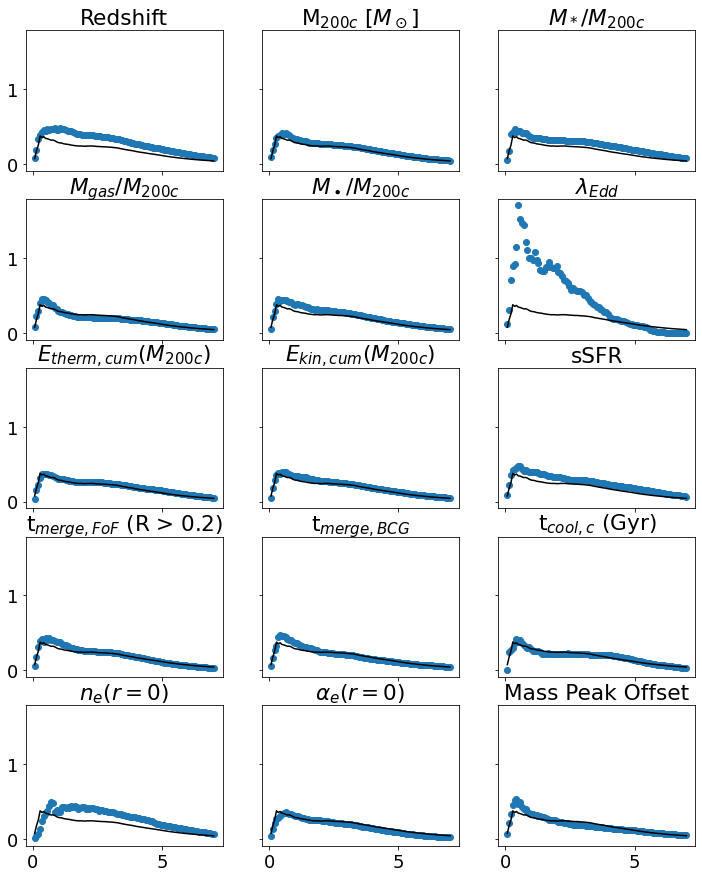

In [12]:
fig, ax = plt.subplots(ncols = 3, nrows = 5, sharex=True, sharey=True, figsize=(12,15))
for i in range(len(label_list)):
    label = label_list[i]
    weights = df[label].values
    weights[np.isnan(weights)] = 0
    weights -= weights.min()
    r, corr2pt = correl_fn_2pt(u, weights1=weights, weights2=weights, nbins=100)
    ax.flatten()[i].scatter(r[1:], corr2pt[1:])
    ax.flatten()[i].plot(r[1:], corr2pt_unweighted[1:], color='k')
    ax.flatten()[i].set_title(label_human_dict[label])
plt.ylim(0,1)
plt.tight_layout()

In [ ]:
fig, ax = plt.subplots(figsize=(10,10))
for i in range(len(label_list)):
    label = label_list[i]
    weights = df[label].values
    weights[np.isnan(weights)] = 0
    weights -= weights.min()
    r, corr2pt = correl_fn_2pt(u, weights1=weights, weights2=weights, nbins=100)
    ax.plot(r[1:], corr2pt[1:], color=cm.tab20b(i), label=label_human_dict[label])
    ax.plot(r[1:], corr2pt_unweighted[1:], color='k')
plt.ylim(0,20)
plt.legend(ncol=2)
plt.tight_layout()
plt.savefig('../../temp/2pt_correl.png', dpi=192)

In [11]:
def get_weights(label):
    weights = df[label].values
    weights -= np.nanmin(weights)
    weights[np.isnan(weights)] = 0
    weights /= weights.max()
    return weights

def correl_weighted_2pt(u, weights1=None, weights2=None, rmax_pct = 95, nbins=10):
    # e.g. Robaina & Bell 2012
    tree = cKDTree(u, compact_nodes=False, balanced_tree=False)
    
    rand = make_random_coord(u)
    treerand = cKDTree(rand, compact_nodes=False, balanced_tree=False)
    
    dist = np.zeros((len(u), len(u)))
    for i in range(len(u)):
        dist[i] = np.linalg.norm(u - u[i], axis=1)
    rmax = int(np.nanpercentile(dist.flatten(), rmax_pct))
    r = np.linspace(0, rmax, nbins)
    
    nn_rand = np.zeros(len(r))
    nn_r = np.zeros(len(r))
    
    for i in range(len(r)):
        nn_r[i] = tree.count_neighbors(tree, r[i], cumulative=False, weights=(weights1, weights2))
        nn_rand[i] = treerand.count_neighbors(treerand, r[i], cumulative=False, weights=(weights1, weights2))
    return r, (nn_r/nn_rand) - 1
    

In [ ]:
    
fig, ax = plt.subplots(ncols = 3, nrows = 5, sharex=True, sharey=True, figsize=(15,15))
for i in range(len(label_list)):
    label = label_list[i]
    weights1 = get_weights(label)
    weights2 = get_weights('m200c')
    r, corr2pt_weight = correl_weighted_2pt(u, weights1=weights1, weights2=weights2, nbins=100)
    ax.flatten()[i].scatter(r[1:], corr2pt_weight[1:])
    ax.flatten()[i].set_title(label_list[i])
# plt.ylim(0,1)
plt.tight_layout()

In [ ]:
    
fig, ax = plt.subplots(ncols = 3, nrows = 5, sharex=True, sharey=True, figsize=(15,15))
for i in range(len(label_list)):
    label = label_raw_list[i]
    weights1 = get_weights(label)
    weights2 = get_weights('m200c')
    r, corr2pt_weight = correl_weighted_2pt(u, weights1=weights1, weights2=weights2, nbins=100)
    ax.flatten()[i].scatter(r[1:], corr2pt_weight[1:])
    ax.flatten()[i].set_title(label_raw_list[i])
# plt.ylim(0,1)
plt.tight_layout()

In [ ]:
#fig, ax = plt.subplots(ncols = 15, nrows = 15, sharex=True, sharey=True, figsize=(15,15))
marks = np.zeros((len(label_raw_list), len(label_raw_list)))
for i in range(len(label_raw_list)):
    label = label_raw_list[i]
    weights1 = get_weights(label)
    for j in range(i, len(label_raw_list)):
        weights2 = get_weights(label_raw_list[j])
        r, corr2pt_weight = correl_weighted_2pt(u, weights1=weights1, weights2=weights2, nbins=100)
        marks[i,j] = corr2pt_weight.max()

In [ ]:
label_raw_list

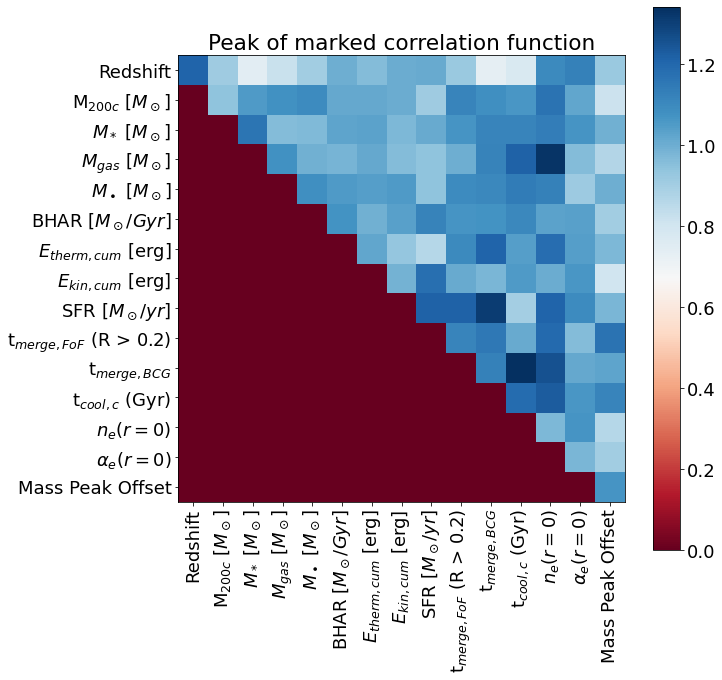

In [121]:
fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(marks/corr2pt_norm.max(), cmap=cm.RdBu)#, norm=colors.Normalize(-1.3,1.3))
lab = [label_raw_dict[label] for label in label_raw_list]
plt.xticks(np.arange(len(label_raw_list)), lab, rotation=90)
plt.yticks(np.arange(len(label_raw_list)), lab)
plt.title("Peak of marked correlation function")
plt.colorbar()

In [ ]:
#fig, ax = plt.subplots(ncols = 15, nrows = 15, sharex=True, sharey=True, figsize=(15,15))
marksnorm = np.zeros((len(label_raw_list), len(label_raw_list)))
for i in range(len(label_list)):
    label = label_list[i]
    weights1 = get_weights(label)
    for j in range(i, len(label_list)):
        weights2 = get_weights(label=label_list[j])
        r, corr2pt_weight = correl_weighted_2pt(u, weights1=weights1, weights2=weights2, nbins=100)
        marksnorm[i,j] = corr2pt_weight.max()
        

In [116]:
r, corr2pt_norm = correl_weighted_2pt(u, nbins=100)
corr2pt_norm.max()

0.4075862068965517

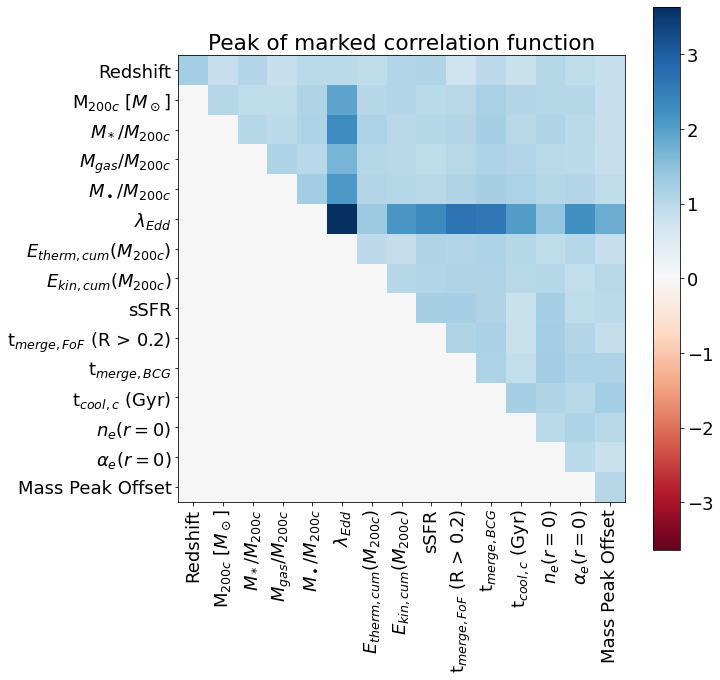

In [118]:
fig, ax = plt.subplots(figsize=(10,10))
marksrenorm = marksnorm/corr2pt_norm.max()
plt.imshow(marksrenorm, cmap=cm.RdBu, norm=colors.Normalize(-marksrenorm.max(), marksrenorm.max()))
lab = [label_human_dict[label] for label in label_list]
plt.xticks(np.arange(len(label_list)), lab, rotation=90)
plt.yticks(np.arange(len(label_list)), lab)
plt.title("Peak of marked correlation function")
plt.colorbar()

In [11]:
def filter_on_prop_per_snap(cat, label, cut_pc = 84, cut_gtr = True):
    #below 1-sigma: cut_pc = 16, cut_gtr = False

    prop = cat[label]
    cut = np.nanpercentile(prop, cut_pc)
    if cut_gtr:
        mask = prop > cut
    else:
        mask = prop < cut
    filtered_cat = cat[mask]
    return filtered_cat

def filter_on_prop(cat, label, cut_pc = 84, cut_gtr = True):
    for snap in snaps:
        sub = cat[cat['snapshot_id'] == snap]
        if snap == snaps[0]:
            filt_cat = filter_on_prop_per_snap(sub, label,cut_pc, cut_gtr)
        else:
            new_filt_cat = filter_on_prop_per_snap(sub, label, cut_pc, cut_gtr)
            filt_cat = pd.concat([filt_cat, new_filt_cat], axis=0)
    return filt_cat

In [12]:
df = pd.read_csv('../../fiducial/dataset/m_test.csv')
add_data(df)
log_columns(df)

In [9]:
snaps = np.unique(df['snapshot_id'])
high_bhar_mask = filter_on_prop(df, 'bh_accr', cut_pc=84, cut_gtr=True) 
low_bhar_mask = filter_on_prop(df, 'bh_accr', cut_pc=16, cut_gtr=False) 
no_recent_merger_mask = filter_on_prop(df, 'time_since_last_major_merger', cut_pc=84, cut_gtr=True) 
recent_merger_mask = filter_on_prop(df, 'time_since_last_major_merger', cut_pc=16, cut_gtr=False) 
high_com_offset_mask = filter_on_prop(df, 'Distance_Criterion', cut_pc=84, cut_gtr=True) 
low_com_offset_mask = filter_on_prop(df, 'Distance_Criterion', cut_pc=16, cut_gtr=False) 

In [8]:
def fit_representation(label, df, rep, snapshot = None):
    prop = df[label]
    
    X = np.column_stack((np.ones_like(prop), rep))
    
    mask = (~np.isnan(prop) * ~np.isinf(prop))
    if snapshot:
        mask *= (df['snapshot_id'] == snapshot)

    # Perform linear regression to fit a plane
    coefficients = np.linalg.lstsq(X[mask, :], prop[mask], rcond=None)[0]
    # intercept, slope_x, slope_y = coefficients
    
    return coefficients

In [9]:
def fit_plane(label, df, u, snapshot=None):
    prop = df[label]
    
    X = np.column_stack((np.ones_like(prop), u[:,0], u[:,1]))
    
    mask = (~np.isnan(prop) * ~np.isinf(prop))
    if snapshot:
        mask *= (df['snapshot_id'] == snapshot)

    # Perform linear regression to fit a plane
    coefficients = np.linalg.lstsq(X[mask, :], prop[mask], rcond=None)[0]
    # intercept, slope_x, slope_y = coefficients
    
    return coefficients

In [10]:
def get_hexbin(prop, u, axis, gridsize, statistic=np.nanmedian):
    vmin = np.nanpercentile(prop, 16)
    vmax = np.nanpercentile(prop, 84)
    clim = max(abs(vmin), abs(vmax))
    
    im = axis.hexbin(u[:,0],u[:,1], 
               C=prop,
               gridsize=gridsize,
               mincnt=1, #else empty hexbins
               reduce_C_function=statistic,
                    cmap=cm.RdBu,
                    vmin = -clim, vmax = clim)
    return im


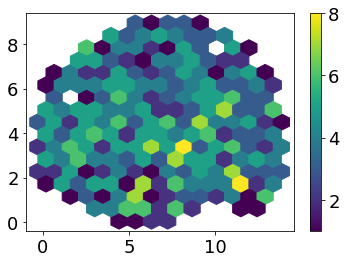

In [20]:
im = plt.hexbin(u[:,0],u[:,1], 
               C=None,
               gridsize=15,
               mincnt=1)
plt.colorbar()

In [9]:
from scipy.stats import binned_statistic_2d

def get_2dhist(prop, u,gridsize, statistic='median'):
    # statistic = 'mean', 'std', 'median', etc
    # other options here: https://docs.scipy.org/doc/scipy/reference/generated/scipy.stats.binned_statistic_2d.html 
    data, _, _, _ = binned_statistic_2d(u[:,0],u[:,1], 
               values=prop,
               bins=gridsize,
               statistic=statistic)
    return data


In [8]:
def prediction_err(df, label, u, fit_type='plane', rep=None):
    if fit_type == 'plane':
        norm = fit_plane(label, df, u)
        pred = norm[0] + norm[1]*u[:,0] + norm[2]*u[:,1]
    else:
        norm = fit_representation(label, df, rep)
        X = np.column_stack((np.ones(len(rep)), rep))
        pred = np.dot(X, norm)

    prop = df[label].values
    prop [np.isnan(prop)] = np.nanmean(prop)
    prop [np.isinf(prop)] = np.nanmean(prop)
    prop[prop ==0] = 1e-2
    diff = (prop-pred)/prop
    return diff

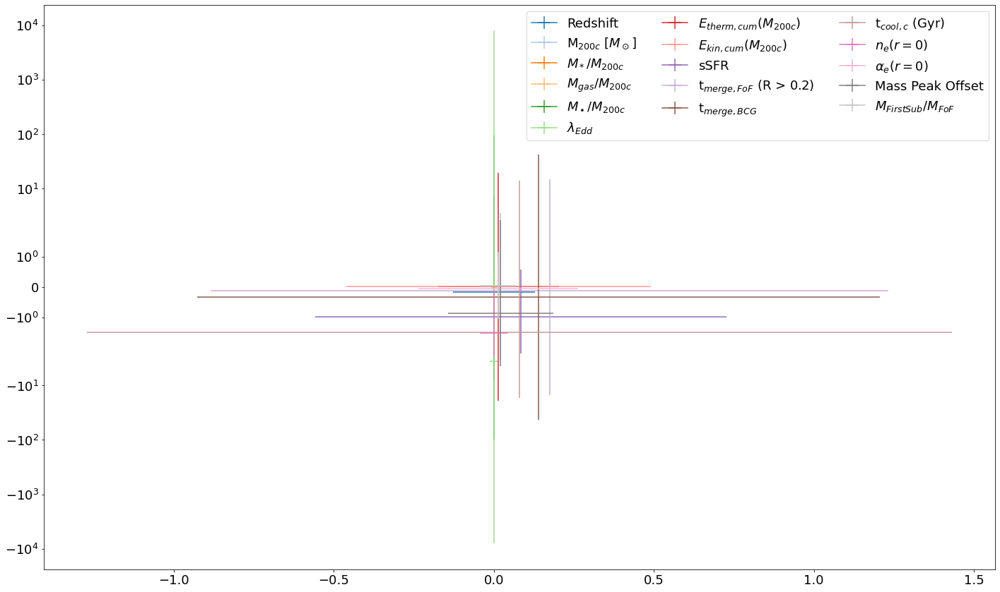

In [27]:
gridsize = 20
fig, ax = plt.subplots(figsize=(20,12))
i = 0    
for label in label_list:
    diff = prediction_err(df, label, u)
    pred_err = get_2dhist(diff, u, gridsize, statistic='median') #.flatten()[i]
    scatter = get_2dhist(df[label], u, gridsize, statistic='std') #.flatten()[i]
    ax.errorbar(np.nanmedian(scatter), np.nanmedian(pred_err), xerr = np.nanstd(scatter), yerr=np.nanstd(pred_err), color=cm.tab20(i), label=label_human_dict[label])
    i += 1

plt.legend(ncol=3)
    
# plt.xlim(-10,10)
# plt.ylim(-5,10)
plt.yscale('symlog')
plt.tight_layout()

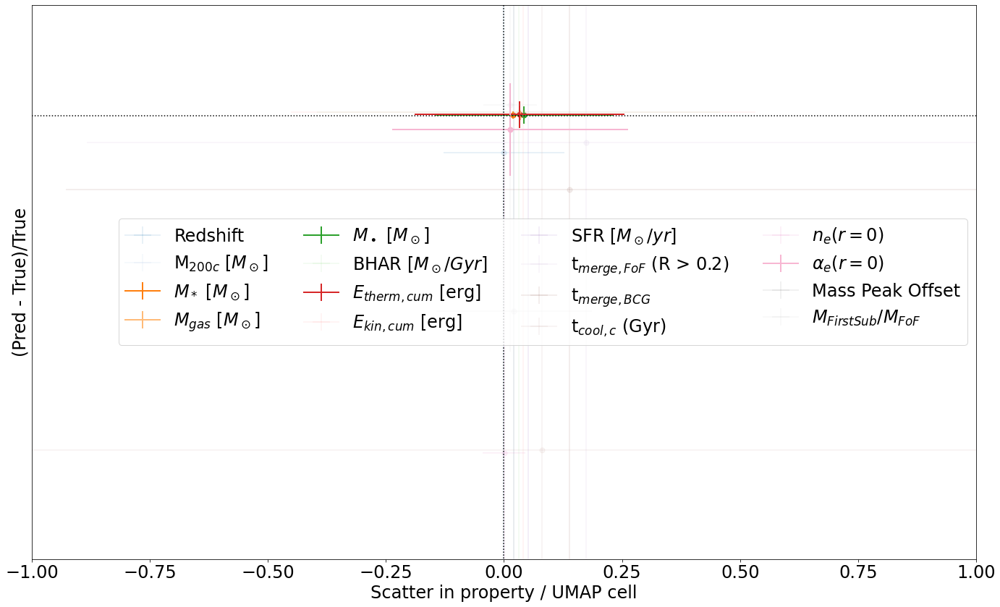

In [69]:
gridsize = 20
fig, ax = plt.subplots(figsize=(20,12))
i = 0    
for label in label_raw_list:
    diff = prediction_err(df, label, u)
    pred_err = get_2dhist(diff, u, gridsize, statistic='median') #.flatten()[i]
    scatter = get_2dhist(df[label], u, gridsize, statistic='std') #.flatten()[i]
    if abs(np.nanmean(pred_err)) < 0.1:
        alpha = 1
    else:
        alpha = 0.1
    ax.scatter(np.nanmedian(scatter), np.nanmedian(pred_err), s=50, color=cm.tab20(i), alpha=alpha)
    ax.errorbar(np.nanmedian(scatter), np.nanmedian(pred_err), xerr = np.nanstd(scatter), yerr=np.nanstd(pred_err), 
                linewidth=2, color=cm.tab20(i), label=label_raw_dict[label], alpha=alpha)
    i += 1

plt.legend(ncol=4, fontsize=24)
plt.hlines(0, -2, 2, color='k', linestyle='dotted')
plt.vlines(0, -1e2, 1e3, color='k', linestyle='dotted')
plt.xlim(-1, 1)
plt.ylim(-2, 0.5)    
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
plt.xlabel('Scatter in property / UMAP cell', fontsize=24)
plt.ylabel('(Pred - True)/True', fontsize=24)
# plt.ylim(-5,10)
plt.yscale('symlog')
plt.tight_layout()
plt.savefig('../../temp/prediction_vs_scatter.png', dpi=192)

In [21]:
plt.errorbar?

No handles with labels found to put in legend.


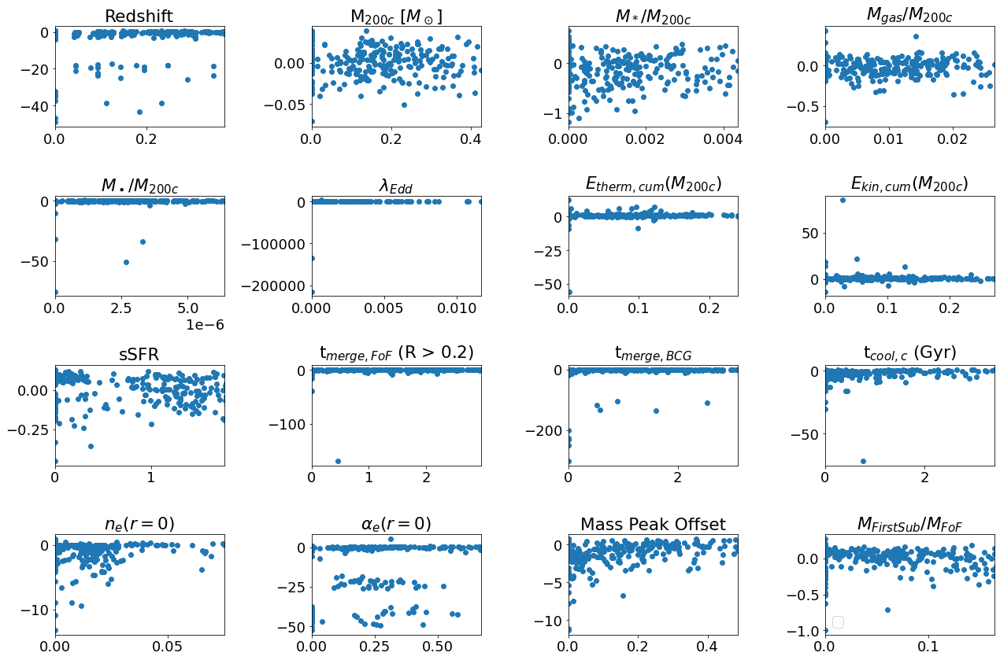

In [77]:
gridsize = 20
fig, ax = plt.subplots(ncols = 4, nrows = 4, figsize = (18,12))
# fig, ax = plt.subplots(figsize=(20,12))
i = 0    
for label in label_list:
    diff = prediction_err(df, label, u)
    pred_err = get_2dhist(diff, u, gridsize, statistic='median') #.flatten()[i]
    scatter = get_2dhist(df[label], u, gridsize, statistic='std') #.flatten()[i]
    xmin = np.nanpercentile(scatter, 5)
    xmax = np.nanpercentile(scatter, 95)

    ax.flatten()[i].scatter(scatter, pred_err)#, color=cm.tab20(i), label=label_human_dict[label])
    ax.flatten()[i].set_title(label_human_dict[label])
    ax.flatten()[i].set_xlim(xmin, xmax)
    i += 1
plt.legend()

# plt.xlim(-10,10)
# plt.ylim(-5,10)
plt.tight_layout()

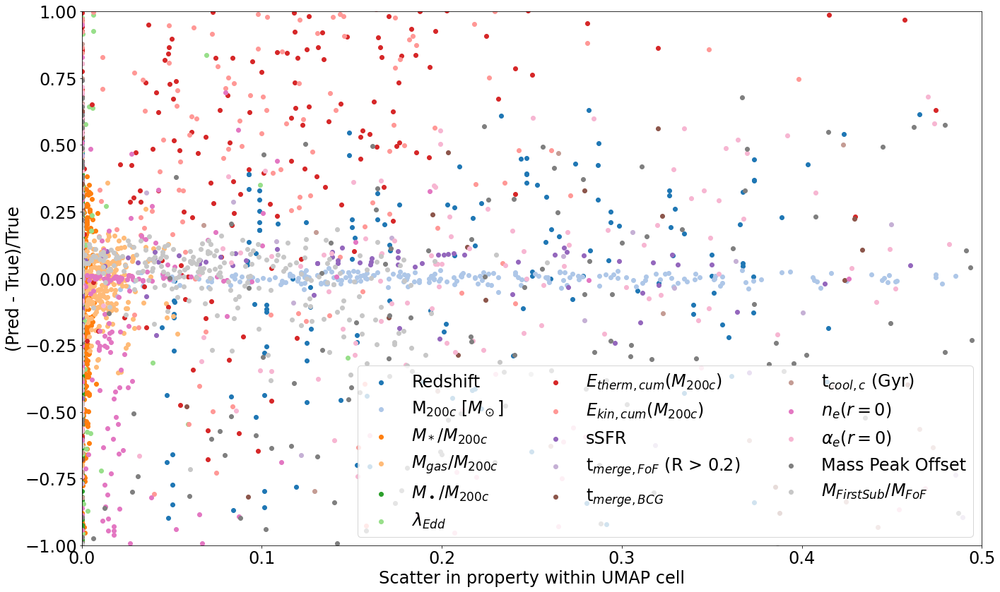

In [91]:

fig, ax = plt.subplots(figsize=(20,12))
i = 0    
for label in label_list:
    diff = prediction_err(df, label, u)
    pred_err = get_2dhist(diff, u, gridsize, statistic='median') #.flatten()[i]
    scatter = get_2dhist(df[label], u, gridsize, statistic='std') #.flatten()[i]
    xmin = np.nanpercentile(scatter, 5)
    xmax = np.nanpercentile(scatter, 95)

    ax.scatter(scatter, pred_err, color=cm.tab20(i), label=label_human_dict[label])

    i += 1
plt.legend(ncol=3, fontsize=24)

plt.xlim(0,0.5)#5)
plt.ylim(-1,1)
plt.xticks(fontsize=24)
plt.yticks(fontsize=24)
plt.xlabel('Scatter in property within UMAP cell', fontsize=24)
plt.ylabel('(Pred - True)/True', fontsize=24)
plt.tight_layout()
plt.savefig('../../temp/error_vs_scatter_in_umap.png', dpi=192)

In [13]:
import glob
basePaths = glob.glob('../../repdim*/'); basePaths.sort()
basePaths[6:]

['../../repdim=16/',
 '../../repdim=2-projdim2/',
 '../../repdim=4-projdim4/',
 '../../repdim=64-projdim16/',
 '../../repdim=64-projdim64/',
 '../../repdim=8/']

In [16]:
from scipy.stats import spearmanr

for path in basePaths[6:]:
    rep = np.load(path+'postprocessing/representation.npy')
    # rep.shape, df.shape
    correl = np.zeros((rep.shape[1], len(label_list)))
    for i in range(correl.shape[0]):
        for j in range(correl.shape[1]):
            x = rep[:, i]
            y = df[label_list[j]]
            mask = (~np.isnan(x)) * (~np.isnan(y))
#             data = np.vstack((x,y))
#             print(data.shape)
            correl[i, j], _ = spearmanr(x[mask], y[mask])
    figsize=correl.T.shape
    fig, ax = plt.subplots(figsize=(figsize[0], figsize[1]+2))
    plt.imshow(correl, cmap=cm.RdBu, norm=colors.Normalize(-1,1))
    plt.colorbar()
    plt.yticks(np.arange(rep.shape[1]))
    plt.xticks(np.arange(len(label_list)), [label_human_dict[key] for key in label_list], rotation='vertical')
    name = path.split('../../')[1].split('/')[0].replace('/','')
    plt.tight_layout()
    plt.savefig('../../temp/rep_phys_corr_%s.png' % name, dpi=192)
    plt.close()

In [25]:

def plot_umap_pred(df, u, clim=0.2, hide_ticks=True, xtext=7, ytext=8, gridsize=None, 
                   label_dict=label_raw_dict, fit_type='plane', rep=None):
    
    label_list = [key for key in label_dict.keys()]
    
    fig, ax = plt.subplots(ncols = 3, nrows = 5, sharex=True, sharey=True, figsize = (12,20))
    i = 0    
    for label in label_list[:len(ax.flatten())]:
        diff = prediction_err(df, label, u, fit_type = fit_type, rep=rep)
        vmin=np.nanpercentile(diff, 2)
        vmax=np.nanpercentile(diff, 98)
        dplussigma = np.nanpercentile(diff, 84)
        dminsigma = np.nanpercentile(diff, 16)
        dmean = (dplussigma + dminsigma)/2.
        dstd = (dplussigma - dminsigma)/2.
        vlim = max(abs(vmin), vmax)
        if gridsize:
            im = get_hexbin(diff, u, ax.flatten()[i], gridsize=gridsize)
        else:
            im = ax.flatten()[i].scatter(u[:,0], u[:,1], c=diff, cmap=cm.RdBu, vmin=max(-clim, -vlim), vmax=min(clim, vlim))
            ax.flatten()[i].text(xtext, ytext, r'$\Delta$ = %0.2f $\pm$ %0.2f' % (dmean, dstd), fontsize=18)
        fig.colorbar(im, ax=ax.flatten()[i])
        ax.flatten()[i].set_title(label_dict[label], fontsize=18)
        i+=1

    if hide_ticks:
        for a in ax.flatten():
            a.set_xticks([])
            a.set_yticks([])


In [11]:
df = pd.read_csv('../../fiducial/dataset/m_test.csv')
add_data(df)
log_columns(df)
u = get_umap('../../repdim=8/', n_neighbors=50, min_dist=0.75)

/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


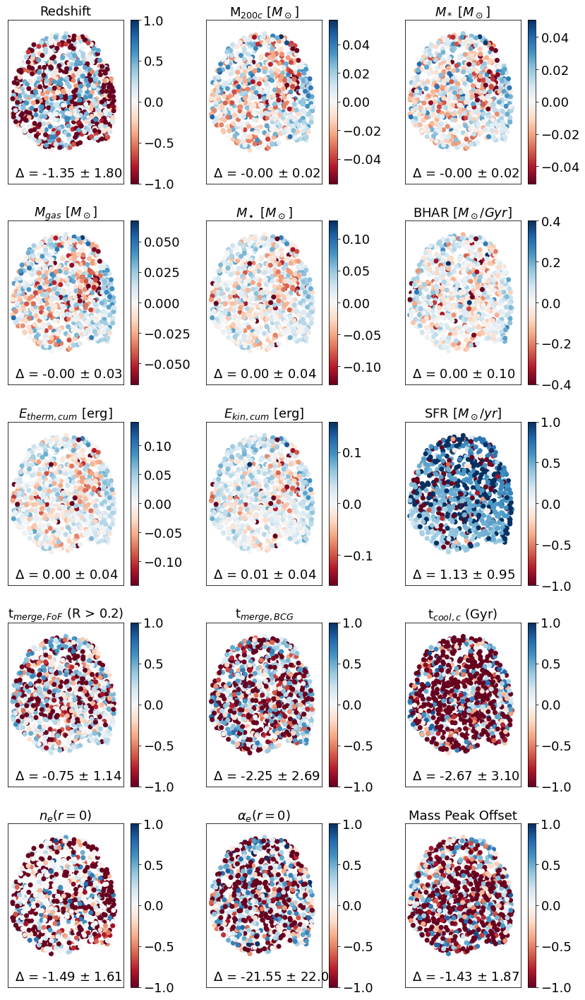

In [51]:
plot_umap_pred(df, u, clim=1, xtext = 0, ytext = -2)
plt.xlim(-1, 15)
plt.ylim(-2.5, 10)
plt.tight_layout()
plt.savefig('../../temp/predict_from_umap_repdim8.pdf')

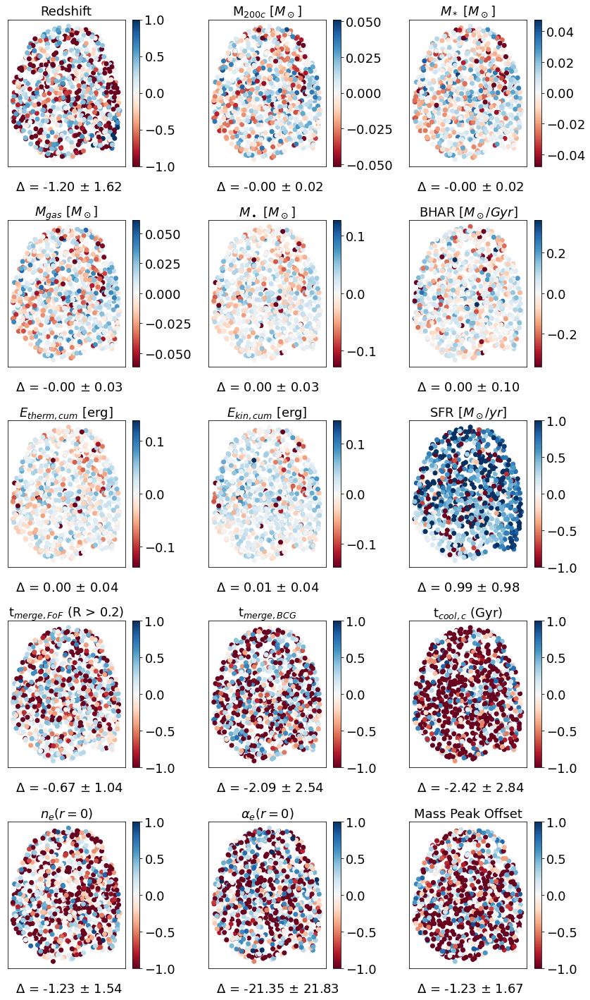

In [28]:
rep = np.load('../../repdim=8/postprocessing/representation.npy')
plot_umap_pred(df, u, clim=1, xtext = 0, ytext = -2, fit_type='rep', rep=rep)
# plt.xlim(-1, 15)
# plt.ylim(-2.5, 10)
plt.tight_layout()
# plt.savefig('../../temp/predict_from_umap_repdim8.pdf')

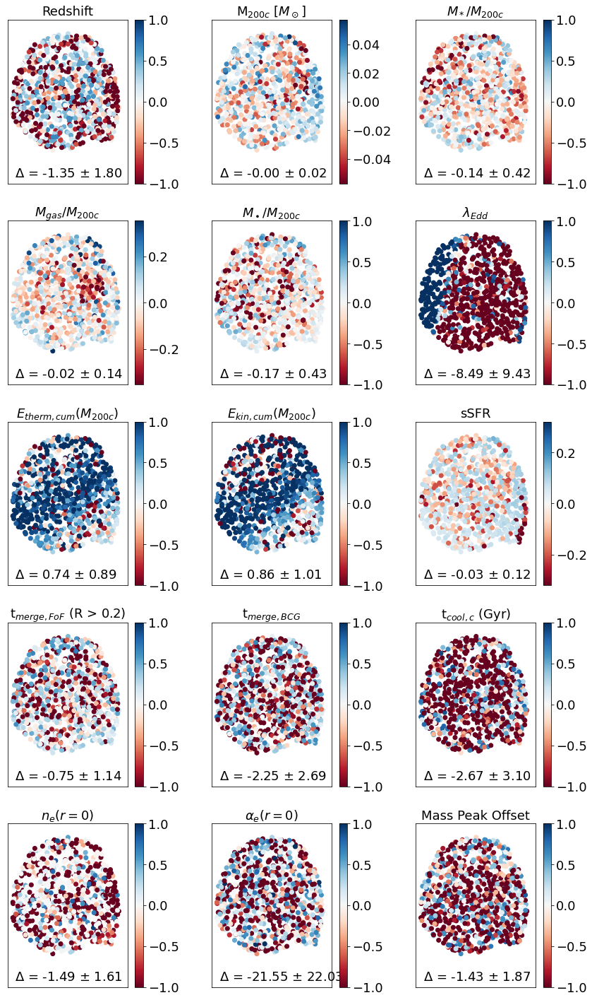

In [54]:
plot_umap_pred(df, u, clim=1, xtext = 0, ytext = -2, label_dict=label_human_dict)
plt.xlim(-1, 15)
plt.ylim(-2.5, 10)
plt.tight_layout()
plt.savefig('../../temp/predict_from_umap_repdim8_m200norm.pdf')

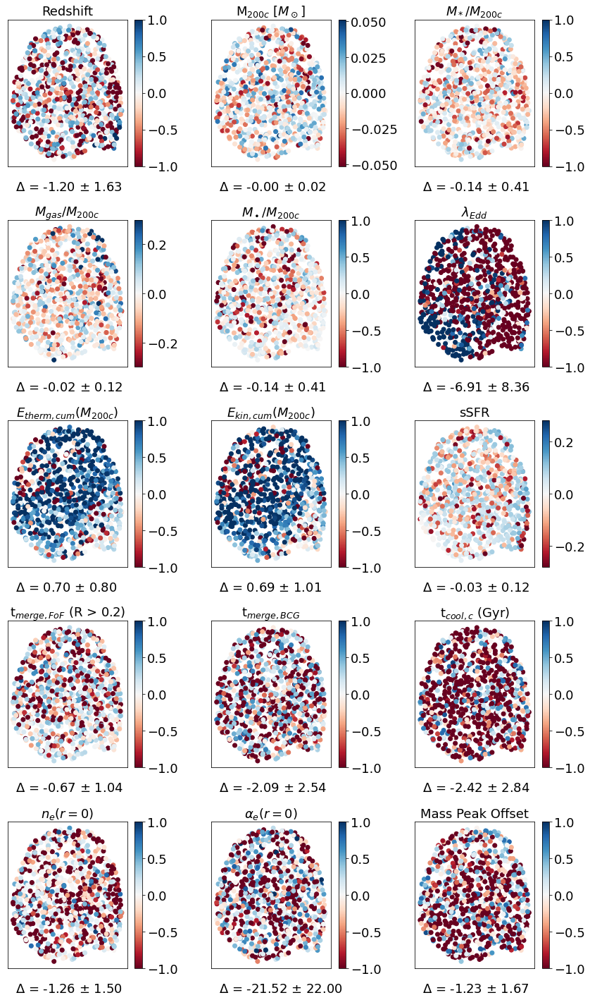

In [31]:
rep = np.load('../../repdim=8/postprocessing/representation.npy')
plot_umap_pred(df, u, clim=1, xtext = 0, ytext = -2, fit_type='rep', rep=rep, label_dict=label_human_dict)
# plt.xlim(-1, 15)
# plt.ylim(-2.5, 10)
plt.tight_layout()
# plt.savefig('../../temp/predict_from_umap_repdim8.pdf')

In [39]:
dtrain = pd.read_csv('../../fiducial/dataset/m_train.csv')
add_data(dtrain)
log_columns(dtrain)
utrain = get_umap('../../repdim=8/', n_neighbors=50, min_dist=0.75, suffix='_train')

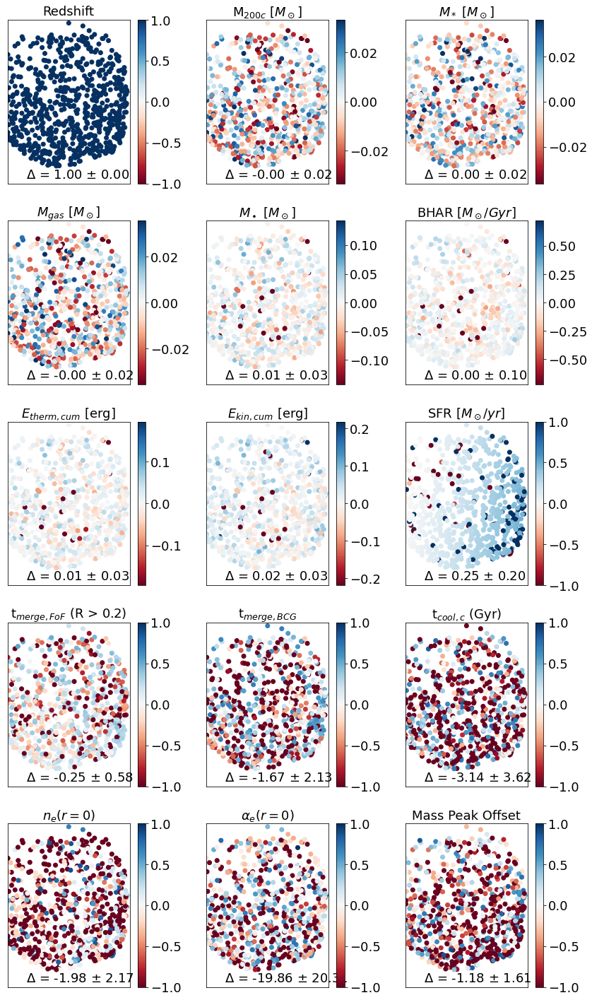

In [49]:
mask = dtrain['snapshot_id'] == 99
# print(mask)
plot_umap_pred(dtrain[mask], utrain[mask], clim=1, xtext = 0, ytext = -3)
plt.xlim(-3, 17)
plt.ylim(-3.5, 12)
plt.tight_layout()
plt.savefig('../../temp/predict_from_umap_repdim8_snapshot99.pdf')

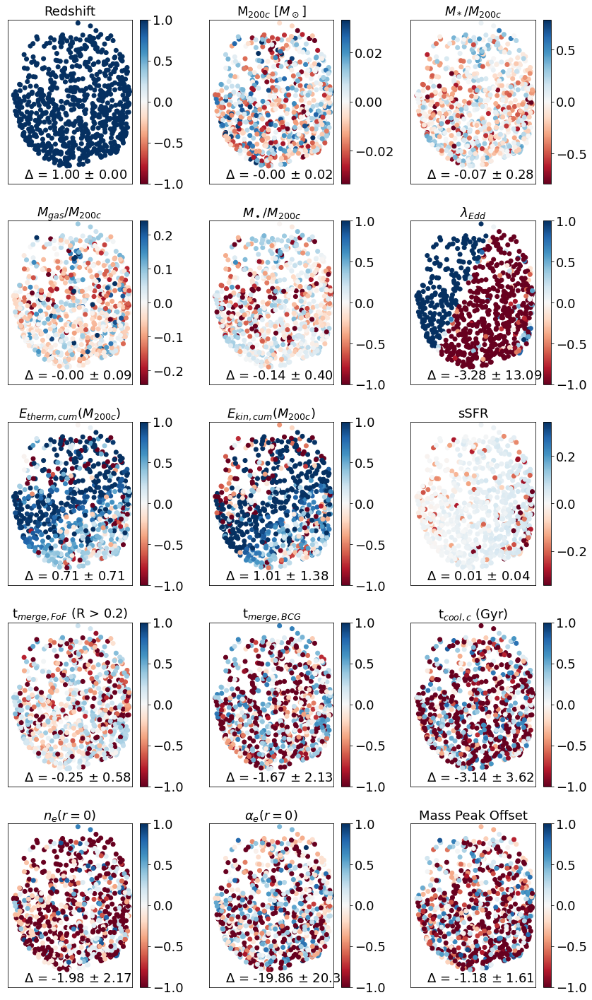

In [53]:
mask = dtrain['snapshot_id'] == 99
# print(mask)
plot_umap_pred(dtrain[mask], utrain[mask], clim=1, xtext = -3, ytext = -3, label_dict=label_human_dict)
plt.xlim(-6, 17)
plt.ylim(-3.5, 12)
plt.tight_layout()
plt.savefig('../../temp/predict_from_umap_repdim8_mnorm_snapshot99.pdf')

plot_umap_pred(df, u, clim=1, xtext = -2.5, ytext = -6, label_dict=label_raw_dict)
plt.tight_layout()
plt.ylim(-7,13)
plt.savefig('../../temp/predict_from_umap_repdim8.pdf')

In [42]:
u2 = get_umap('../../repdim=2-projdim2/', n_neighbors=5, min_dist=0.75)

/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


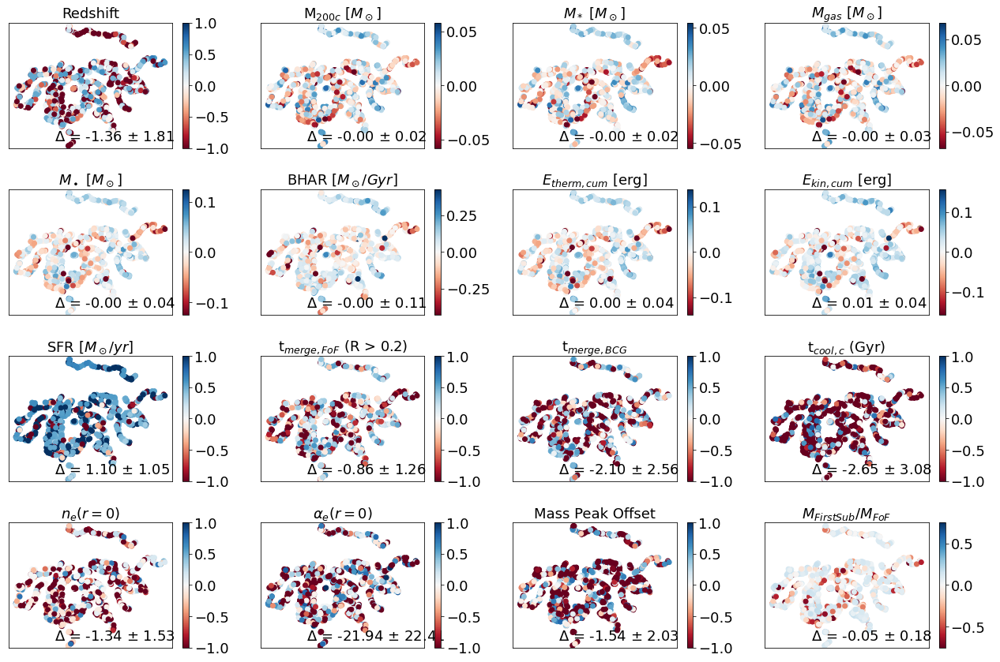

In [47]:
plot_umap_pred(df, u2, clim=1, xtext = -2.5, ytext = -15, label_dict=label_raw_dict)
plt.tight_layout()
plt.ylim(-17,18)
plt.savefig('../../temp/predict_from_umap_repdim2.pdf')

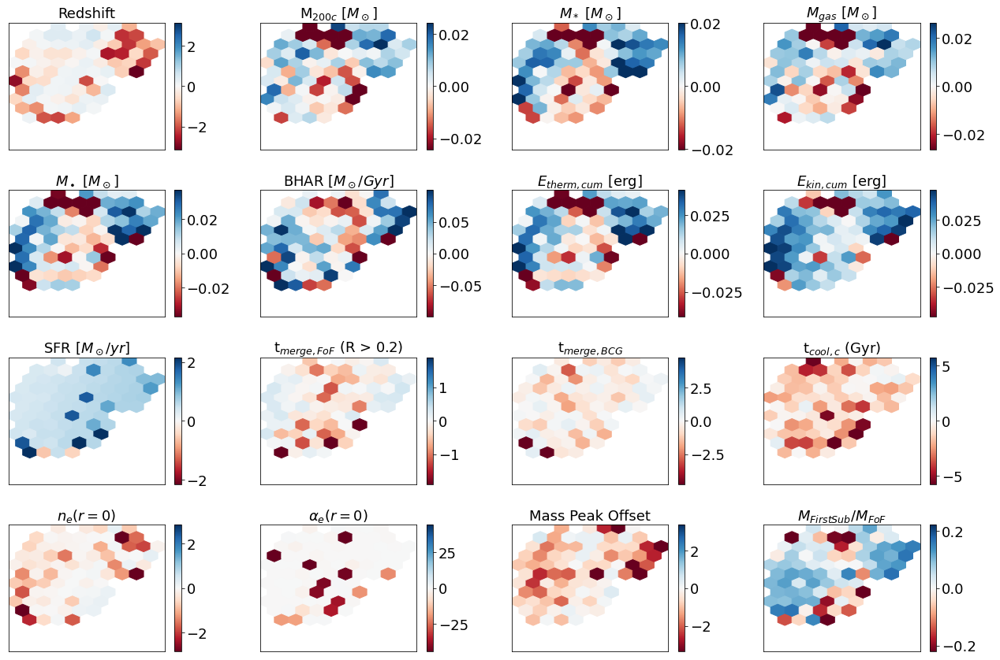

In [36]:
plot_umap_pred(df, u16, clim=1, xtext = -2.5, ytext = -5, label_dict=label_raw_dict, gridsize=10)
plt.tight_layout()
plt.ylim(-6,15)
plt.savefig('../../temp/predict_from_umap_repdim16_hexbin.pdf')

In [37]:
u128 = get_umap('../../repdim=128-projdim128/', n_neighbors=5, min_dist=0.75)

/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


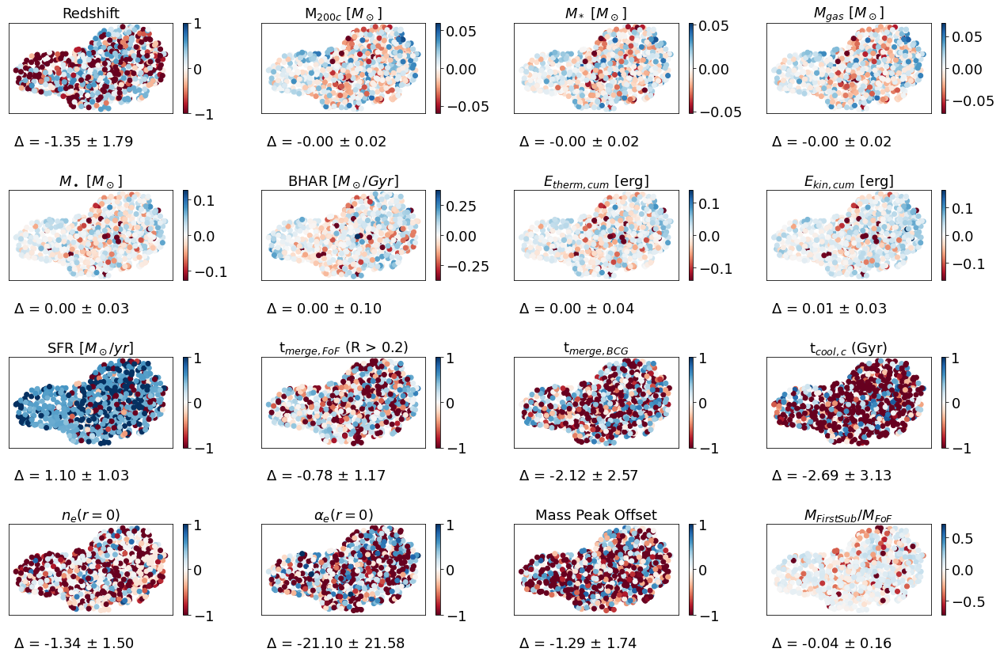

In [38]:
plot_umap_pred(df, u128, clim=1, xtext = -2.5, ytext = -5, label_dict=label_raw_dict)
plt.tight_layout()
# plt.ylim(-6,15)
plt.savefig('../../temp/predict_from_umap_repdim128.pdf')

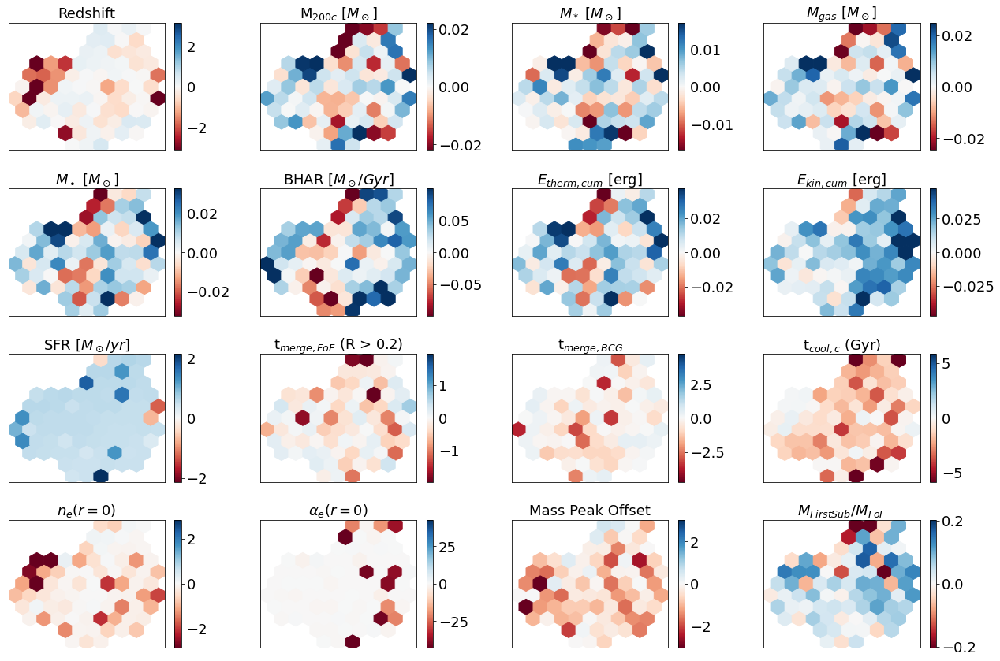

In [39]:
plot_umap_pred(df, u128, clim=1, xtext = -2.5, ytext = -5, label_dict=label_raw_dict, gridsize=10)
plt.tight_layout()
# plt.ylim(-6,15)
plt.savefig('../../temp/predict_from_umap_repdim128_hexbin.pdf')

In [99]:
import matplotlib.pylab as plt

#now let's plot the error as a function of repdim
def error_vs_ndim(df, dirpaths, names, reptype='umap', xlabel=r'$N_{\rm rep}$', only_good=True, only_bad = False, ylim = 0.1, showsigma=True):
    j = 0
    for label in label_list:
        medianerr = np.zeros(len(dirpaths))
        sigmalesserr = np.zeros(len(dirpaths)) #median - 1 sigma
        sigmamoreerr = np.zeros(len(dirpaths)) #median + 1 sigma
        i = 0
        for path in dirpaths:
            if reptype == 'umap':
                try:
                    u = get_umap(path, suffix='_test')
                except FileNotFoundError:
                    u = get_umap(path, suffix='')
                norm = fit_plane(label, df, u)
                X = np.column_stack((np.ones(len(u)), u))
                pred = np.dot(X, norm)
    
            else:
                try:
                    rep = np.load(path+'/postprocessing/representation_test.npy')
                except FileNotFoundError:    
                    rep = np.load(path+'/postprocessing/representation.npy')
                X = np.column_stack((np.ones(len(rep)), rep))
                coeff = fit_representation(label, df, rep)
                pred = np.dot(X, coeff)
                
            prop = df[label].values
            prop [np.isnan(prop)] = np.nanmean(prop)
            prop [np.isinf(prop)] = np.nanmean(prop)
            prop[prop ==0] = 1e-2
            diff = (prop-pred)/prop
            medianerr[i] = np.nanpercentile(diff, 50)
            sigmamoreerr[i] = np.nanpercentile(diff, 84)
            sigmalesserr[i] = np.nanpercentile(diff, 16)
            i += 1

        color = cm.tab20(j)
        if only_good:
            cond = max(abs(sigmamoreerr)) < 0.1
        elif only_bad:
            cond = max(abs(sigmamoreerr)) > 0.1
        else:
            cond = True
        if cond:
                plt.plot(np.arange(len(dirpaths)), medianerr, c=color, label=label_human_dict[label])
                if showsigma:
                    plt.plot(np.arange(len(dirpaths)), sigmalesserr, color=color, alpha=0.75, linestyle='dotted')
                    plt.plot(np.arange(len(dirpaths)), sigmamoreerr, color=color, alpha=0.752, linestyle='dotted')
            
                j += 1
    plt.legend(ncol = 3, fontsize=14)
    plt.xticks(np.arange(len(names)), names)
    plt.xlabel(xlabel)
    plt.ylim(-ylim, ylim)
    plt.xlim(0,len(names)-1)

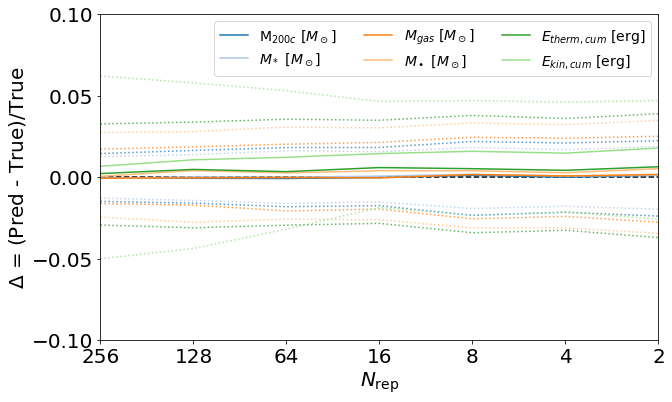

In [124]:
dirpaths = ['../../fiducial/','../../repdim=128-projdim128/', '../../repdim=64-projdim64/', '../../repdim=16/', '../../repdim=8/', '../../repdim=4-projdim4/', '../../repdim=2-projdim2/']
names = ['256', '128', '64','16','8', '4','2']

plt.rcParams['font.size'] = 20
error_vs_ndim(df, dirpaths, names, ylim = 0.1, reptype='rep')
fig = plt.gcf()
fig.set_figwidth(10)
fig.set_figheight(6)
plt.hlines(0, 0, len(dirpaths), color='k', linestyle='dashed')
plt.ylabel(r'$\Delta$ = (Pred - True)/True')
plt.yticks([-0.1, -0.05, 0, 0.05, 0.1])
plt.savefig('../../temp/prediction_vs_repdim.png', dpi=192)

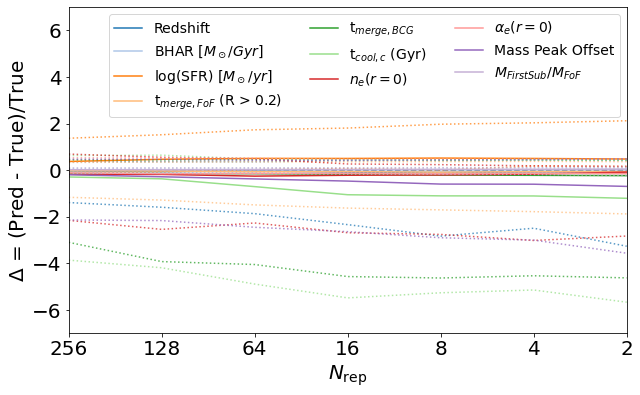

In [125]:
error_vs_ndim(df, dirpaths, names, ylim = 7, reptype='rep', only_bad=True, only_good=False, showsigma=True)
fig = plt.gcf()
fig.set_figwidth(10)
fig.set_figheight(6)
plt.hlines(0, 0, len(dirpaths), color='k', linestyle='dashed')
plt.ylabel(r'$\Delta$ = (Pred - True)/True')
plt.savefig('../../temp/prediction_vs_repdim_badprops_withsigma.png', dpi=192)

/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_j

/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_j

/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_j

/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_j

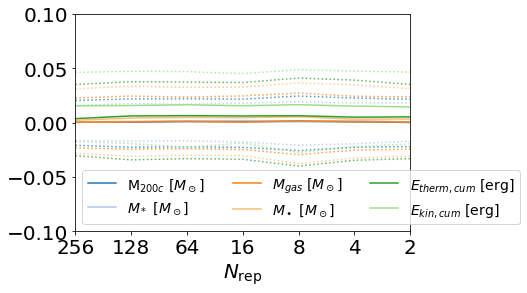

In [126]:
error_vs_ndim(df, dirpaths, names, ylim = 0.1)
plt.savefig('../../temp/prediction_vs_repdim_umap.png', dpi=192)

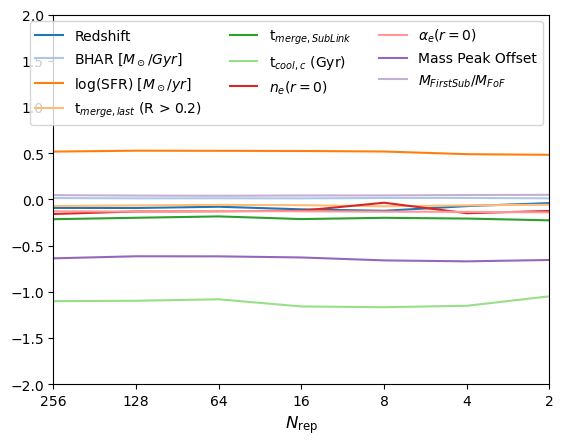

In [158]:
error_vs_ndim(df, dirpaths, names, only_good=False, only_bad=True, ylim=2)
plt.savefig('../../temp/prediction_vs_repdim_badprops_umap.png', dpi=192)

In [17]:
def relative_angles(df, u, label1, label2, snapshot=None):
    intercept, a1, b1 = fit_plane(label1, df, u, snapshot=snapshot)
    intercept, a2, b2 = fit_plane(label2, df, u, snapshot=snapshot)
    v1 = np.array([a1, b1])
    v2 = np.array([a2, b2])
    v1 /= np.linalg.norm(v1)
    v2 /= np.linalg.norm(v2)
    return np.dot(v1, v2)


In [18]:
mass_and_redshift = {'z': 'Redshift',
                    'm200c': r'M$_{200c}$ [$M_\odot$]', 
                    'stellar_mass': r'$M_*$ [$M_\odot$]',
                    'gas_mass': r'$M_{gas}$ [$M_\odot$]',
                    'bh_mass': r'$M_\bullet$ [$M_\odot$]',
                    # 'm500c': r'M$_{500c}$ [$M_\odot$]', 
                    'bh_accr': r'BHAR [$M_\odot/Gyr$]'
                    # 'bh_einj_cum': r'$E_{inj, cum} (Tot)$ [erg]',
                    } 
bh_sfr_merge = {    'bh_tinj_cum': r'$E_{therm, cum} $ [erg]',
                    'bh_kinj_cum': r'$E_{kin, cum}$ [erg]', 
                    'log_sfr': r'log(SFR) [$M_\odot/yr$]',
                    'time_since_last_major_merger': r't$_{merge, FoF}$ (R > 0.2)', 
                    'sublink_tmerge_major': 't$_{merge, BCG}$',
                    'centralCoolingTime': r't$_{cool,c}$ (Gyr)',
                    'central_ne': r'$n_e ( r = 0)$',
                    'slope_ne': r'$\alpha_e (r = 0)$',
                    'Distance_Criterion': 'Mass Peak Offset'}


In [19]:
def plot_correlation_angles(label_dict, df, u, snapshot=None, fig=None, ax=None, colorbar=False):
    if not fig:
        fig, ax = plt.subplots(figsize=(12,10))
        
    label_list = [key for key in label_dict.keys()]
    angles = np.zeros((len(label_list), len(label_list)))
    for i in range(len(label_list)):
            for j in range(i, len(label_list)):
                angles[i,j] = relative_angles(df, u, label_list[i], label_list[j], snapshot=snapshot)
    #         for j in range(i):
#             angles[i,j] = np.nan

    
    im = ax.imshow(np.rad2deg(np.arccos(angles)), cmap=cm.RdBu_r, norm=colors.Normalize(0,180))
    ticks = [k for k in label_dict.values()]
    _ = ax.set_xticks(np.arange(len(label_list)))
    _ = ax.set_xticklabels(ticks, rotation=75)
    _ = ax.set_yticks(np.arange(len(label_list)))
    _ = ax.set_yticklabels(ticks)
    if colorbar:
        fig.colorbar(im, ax=ax, label=r'$\theta_{12} = \arccos(\hat{n_1} \cdot \hat{n_2})$')
    plt.tight_layout()
    return fig, ax

/tmp/ipykernel_43726/3651366634.py:14: RuntimeWarning: invalid value encountered in arccos
  im = ax.imshow(np.rad2deg(np.arccos(angles)), cmap=cm.RdBu_r, norm=colors.Normalize(0,180))


(<Figure size 864x720 with 2 Axes>, <AxesSubplot:>)

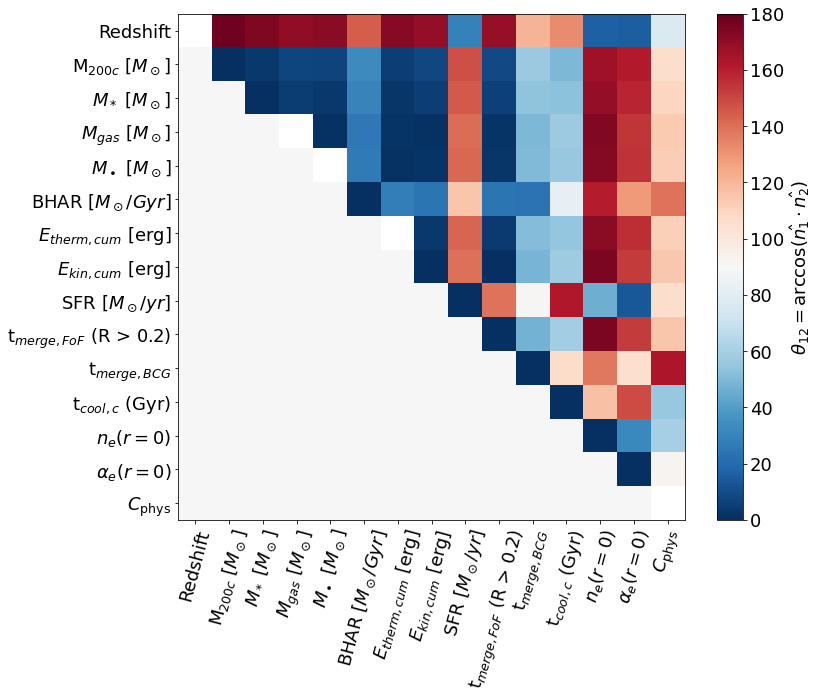

In [25]:
plot_correlation_angles(label_raw_dict, df, u, colorbar=True)

/tmp/ipykernel_43726/4010279104.py:6: RuntimeWarning: invalid value encountered in true_divide
  v1 /= np.linalg.norm(v1)
/tmp/ipykernel_43726/4010279104.py:7: RuntimeWarning: invalid value encountered in true_divide
  v2 /= np.linalg.norm(v2)
/tmp/ipykernel_43726/3651366634.py:14: RuntimeWarning: invalid value encountered in arccos
  im = ax.imshow(np.rad2deg(np.arccos(angles)), cmap=cm.RdBu_r, norm=colors.Normalize(0,180))


(<Figure size 864x720 with 2 Axes>, <AxesSubplot:>)

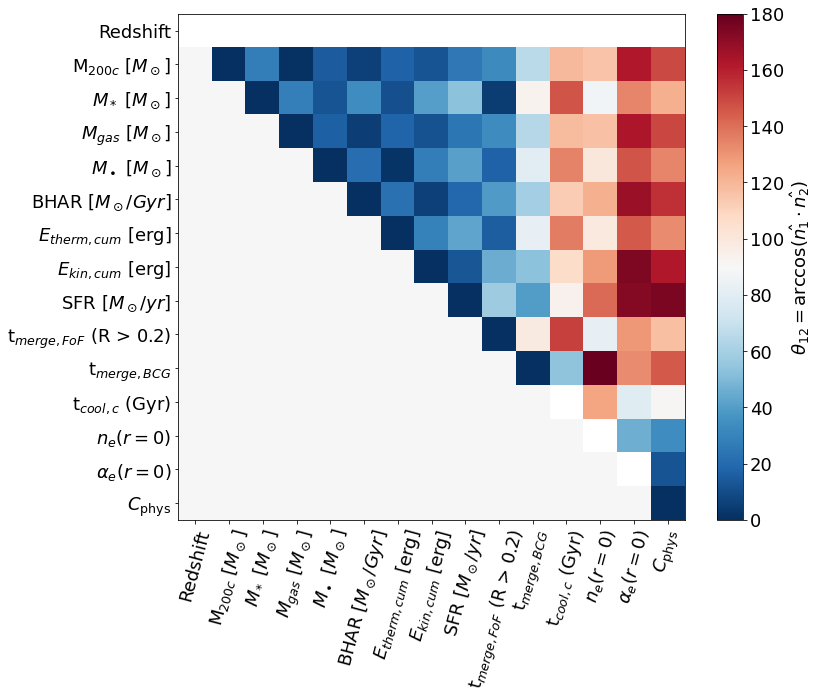

In [28]:
plot_correlation_angles(label_raw_dict, df[df['snapshot_id'] == 99], u[df['snapshot_id'] == 99], colorbar=True)

/tmp/ipykernel_43726/4010279104.py:6: RuntimeWarning: invalid value encountered in true_divide
  v1 /= np.linalg.norm(v1)
/tmp/ipykernel_43726/4010279104.py:7: RuntimeWarning: invalid value encountered in true_divide
  v2 /= np.linalg.norm(v2)
/tmp/ipykernel_43726/3651366634.py:14: RuntimeWarning: invalid value encountered in arccos
  im = ax.imshow(np.rad2deg(np.arccos(angles)), cmap=cm.RdBu_r, norm=colors.Normalize(0,180))


(<Figure size 864x720 with 2 Axes>, <AxesSubplot:>)

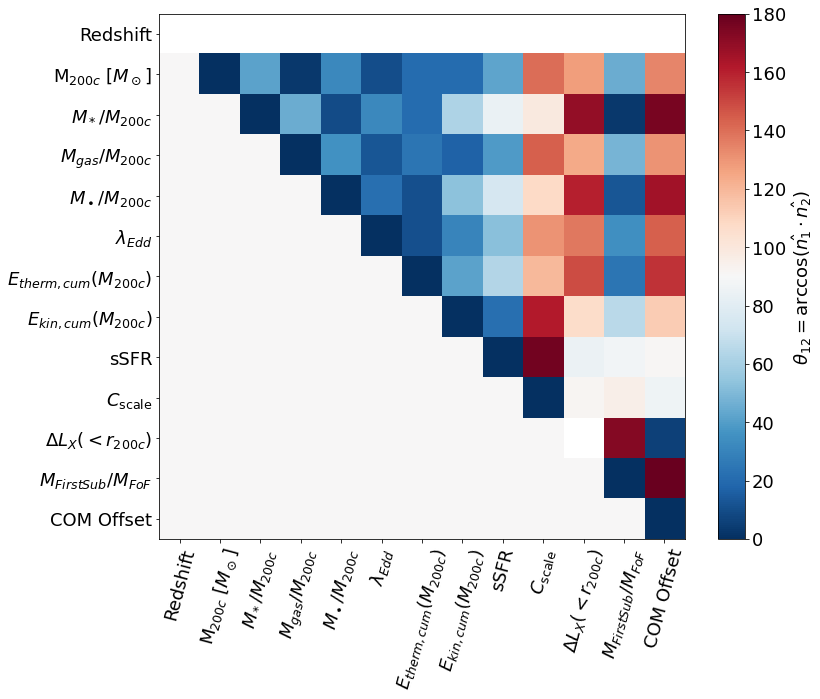

In [29]:
plot_correlation_angles(label_human_dict, df[df['snapshot_id'] == 99], u[df['snapshot_id'] == 99], colorbar=True)

In [ ]:
df = pd.read_csv('../../fiducial/dataset/m_train.csv')
add_data(df)
log_columns(df)
u_d25 = get_umap('../../repdim=8/', '_train', 50, 0.25)
u_d50 = get_umap('../../repdim=8/', '_train', 50, 0.5)
u_d75 = get_umap('../../repdim=8/', '_train', 50, 0.75)
us = [u_d25, u_d50, u_d75]

/tmp/ipykernel_52176/3651366634.py:14: RuntimeWarning: invalid value encountered in arccos
  im = ax.imshow(np.rad2deg(np.arccos(angles)), cmap=cm.RdBu_r, norm=colors.Normalize(0,180))


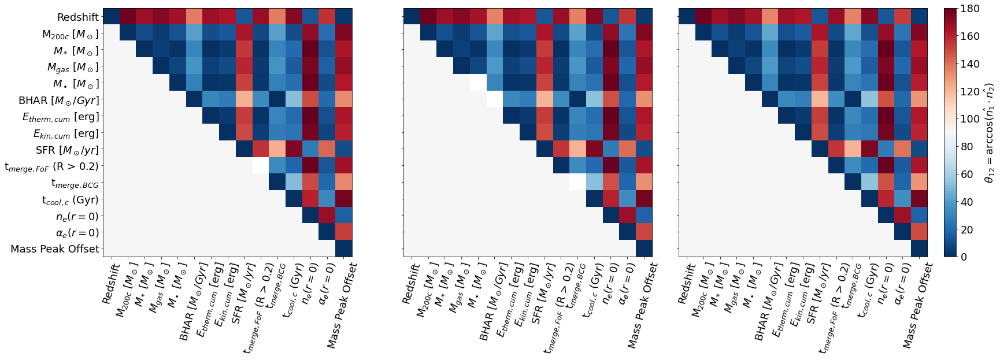

In [107]:
fig, ax = plt.subplots(ncols=3, sharex=True, sharey=True, figsize=(25,9))
for i in range(3):
    plot_correlation_angles(label_raw_dict, df, us[i], fig=fig, ax=ax[i], colorbar=(i == 2))
plt.tight_layout(h_pad=-2, w_pad=-2)
plt.show()

/tmp/ipykernel_52176/3651366634.py:14: RuntimeWarning: invalid value encountered in arccos
  im = ax.imshow(np.rad2deg(np.arccos(angles)), cmap=cm.RdBu_r, norm=colors.Normalize(0,180))


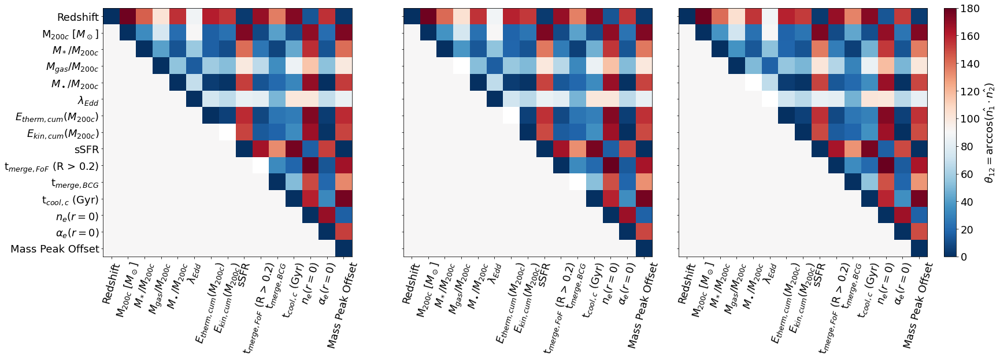

In [115]:
fig, ax = plt.subplots(ncols=3, sharex=True, sharey=True, figsize=(25,9))
for i in range(3):
    plot_correlation_angles(label_human_dict, df, us[i], fig=fig, ax=ax[i], colorbar=(i == 2))
plt.tight_layout(h_pad=-2, w_pad=-2)
plt.show()

In [111]:
angles25 = np.zeros((len(label_list), len(label_list)))
angles50 = np.zeros((len(label_list), len(label_list)))
angles75 = np.zeros((len(label_list), len(label_list)))
for i in range(len(label_list)):
        for j in range(i, len(label_list)):
            angles25[i,j] = relative_angles(df, u_d25, label_list[i], label_list[j])
            angles50[i,j] = relative_angles(df, u_d50, label_list[i], label_list[j])
            angles75[i,j] = relative_angles(df, u_d75, label_list[i], label_list[j])

a25_50 = angles25/angles50
a25_75 = angles25/angles75
a25_50[~np.isnan(a25_50)], a25_75[~np.isnan(a25_75)]

#ok, so they are very similar but not identical, which is great

/tmp/ipykernel_52176/2593642382.py:1: RuntimeWarning: invalid value encountered in true_divide
  a25_50 = angles25/angles50
/tmp/ipykernel_52176/2593642382.py:2: RuntimeWarning: invalid value encountered in true_divide
  a25_75 = angles25/angles75


(array([1.        , 0.99974186, 1.03498033, 0.92300009, 1.00971726,
        1.13850452, 1.00571545, 1.00724009, 0.99995747, 1.00140449,
        1.01627985, 1.00116452, 1.00047296, 1.01416684, 1.00058348,
        1.        , 1.0357083 , 0.95523029, 1.01081498, 1.66596836,
        1.00664684, 1.00885607, 0.99931094, 1.00195038, 1.01984705,
        1.00055051, 1.00138692, 1.01481748, 1.00039257, 1.        ,
        0.94914704, 1.00543974, 0.92936289, 1.00924699, 1.00604967,
        1.03933054, 1.01862945, 0.99672384, 1.05530628, 1.01972425,
        1.00324957, 1.04829028, 1.        , 0.94984985, 1.00338929,
        0.94862945, 0.96019528, 0.88957123, 0.94609845, 0.97762392,
        0.89751391, 0.95880573, 0.93989849, 0.9449959 , 1.        ,
        0.93430595, 1.00044099, 0.99982007, 1.01105284, 1.00330832,
        0.99839762, 1.01897354, 1.00393869, 1.00007705, 1.01639004,
        1.        , 0.93192178, 0.95318839, 1.062985  , 0.91965765,
        0.97455959, 0.98692515, 0.95552888, 0.91

In [112]:
u_n10 = get_umap('../../repdim=8/', '_train', 10, 0.25)
u_n50 = get_umap('../../repdim=8/', '_train', 50, 0.25)
u_n100 = get_umap('../../repdim=8/', '_train', 100, 0.25)
uns = [u_n10, u_n50, u_n100]

/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
/u/uchadaya/.local/lib/python3.9/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


<Figure size 432x288 with 0 Axes>

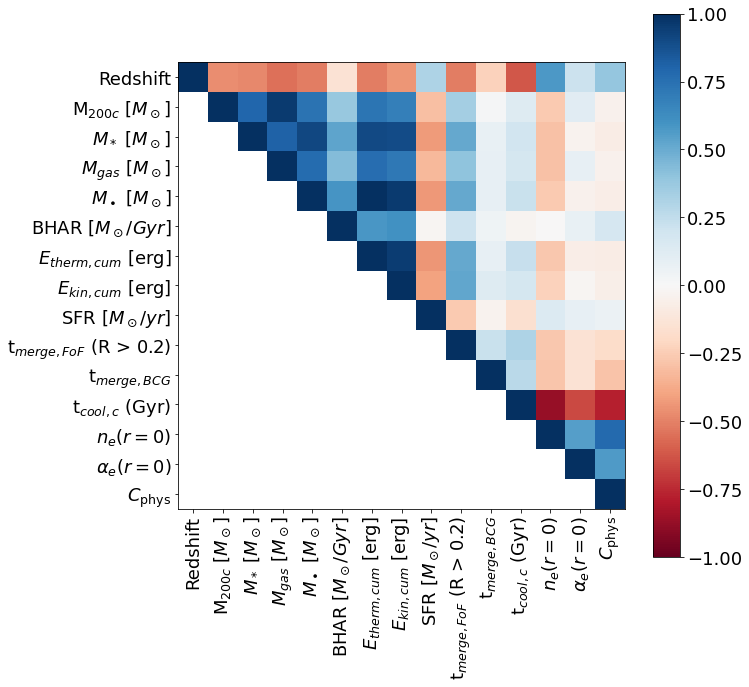

In [79]:
def get_correlation(df, u, field1, field2, NUM_IMAGES_PER_SIDE=12):
    median1 = get_hexbin(df[field1], u, plt.gca(), gridsize=NUM_IMAGES_PER_SIDE, statistic=np.nanmedian).get_array()
    median2 = get_hexbin(df[field2], u, plt.gca(), gridsize=NUM_IMAGES_PER_SIDE, statistic=np.nanmedian).get_array()
    mask = (~np.isnan(median1)) * (~np.isnan(median2))
    r, _ = spearmanr(median1[mask], median2[mask])
    return r
    
correl = np.zeros((len(label_raw_list), len(label_raw_list)))
for i in range(len(correl)):
    for j in range(i, len(correl)):
        try:
            correl[i,j] = get_correlation(df, u, label_raw_list[i], label_raw_list[j])
        except ValueError:
            correl[i,j] = np.nan
    correl[i,:i] = np.nan

plt.clf()

fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(correl, cmap=cm.RdBu, norm=colors.Normalize(-1,1))
ticks = [label_raw_dict[key] for key in label_raw_list]
plt.xticks(np.arange(len(correl)), ticks, rotation='vertical')
plt.yticks(np.arange(len(correl)), ticks)
plt.colorbar()

<Figure size 432x288 with 0 Axes>

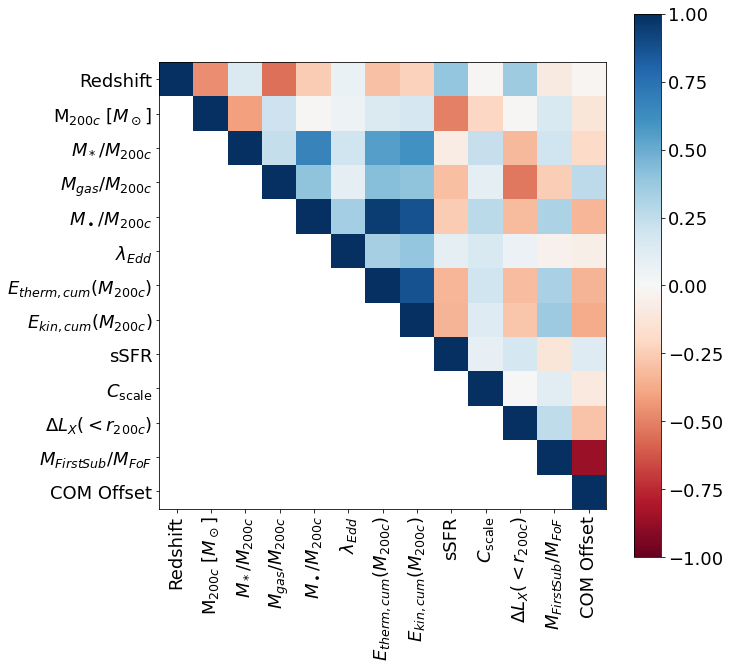

In [80]:
correl = np.zeros((len(label_list), len(label_list)))
for i in range(len(correl)):
    for j in range(i, len(correl)):
        try:
            correl[i,j] = get_correlation(df, u, label_list[i], label_list[j])
        except ValueError:
            correl[i,j] = np.nan
    correl[i,:i] = np.nan

plt.clf()

fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(correl, cmap=cm.RdBu, norm=colors.Normalize(-1,1))
ticks = [label_human_dict[key] for key in label_list]
plt.xticks(np.arange(len(correl)), ticks, rotation='vertical')
plt.yticks(np.arange(len(correl)), ticks)
plt.colorbar()

<Figure size 432x288 with 0 Axes>

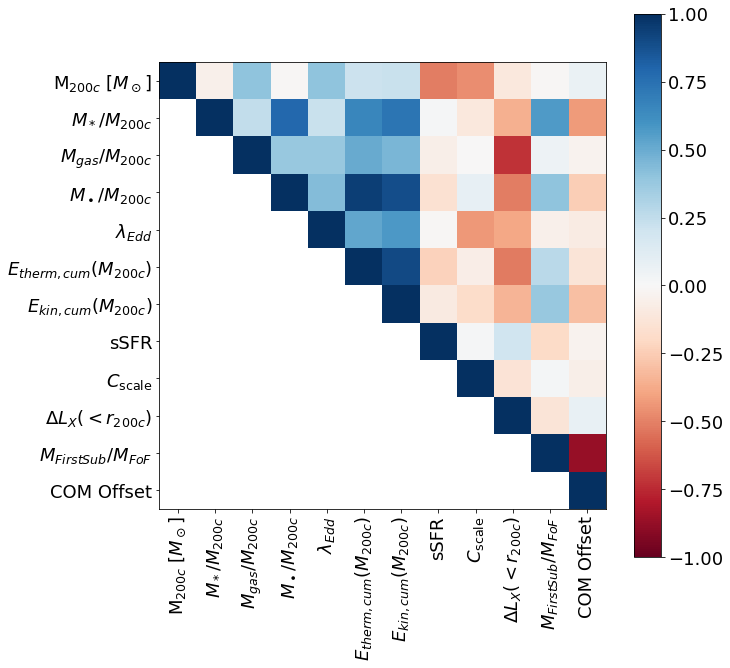

In [82]:
correl = np.zeros((len(label_list[1:]), len(label_list[1:])))
for i in range(len(correl)):
    for j in range(i, len(correl)):
        try:
            correl[i,j] = get_correlation(df[df['snapshot_id'] ==99], u[df['snapshot_id']==99],
                                          label_list[i+1], label_list[j+1])
        except ValueError:
            correl[i,j] = np.nan
    correl[i,:i] = np.nan

plt.clf()

fig, ax = plt.subplots(figsize=(10,10))
plt.imshow(correl, cmap=cm.RdBu, norm=colors.Normalize(-1,1))
ticks = [label_human_dict[key] for key in label_list[1:]]
plt.xticks(np.arange(len(correl)), ticks, rotation='vertical')
plt.yticks(np.arange(len(correl)), ticks)
plt.colorbar()

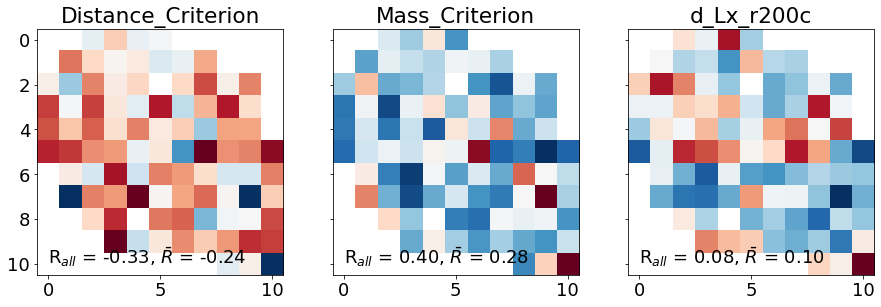

In [65]:
props = ['Distance_Criterion', 'Mass_Criterion', 'd_Lx_r200c']
fig, ax = plt.subplots(ncols = len(props), sharex=True, sharey=True, figsize=(len(props)*5, 5))
for i in range(len(props)):
    correl = get_correlation(df, u, props[i], 'time_since_last_major_merger',12)
    ax.flatten()[i].imshow(correl, cmap=cm.RdBu, norm=colors.Normalize(-1,1))
    ax.flatten()[i].set_title(props[i])
    x = df[props[i]]
    y = df['time_since_last_major_merger']
    mask = (~np.isnan(x)) * (~np.isnan(y))
    corr, _ = spearmanr(x[mask], y[mask])
    ax.flatten()[i].text(0, 10, r'R$_{all}$ = %0.2f, $\bar{R}$ = %0.2f' % (corr, np.nanmean(correl)) )
    #no, this won't do either

/tmp/ipykernel_52176/3651366634.py:14: RuntimeWarning: invalid value encountered in arccos
  im = ax.imshow(np.rad2deg(np.arccos(angles)), cmap=cm.RdBu_r, norm=colors.Normalize(0,180))


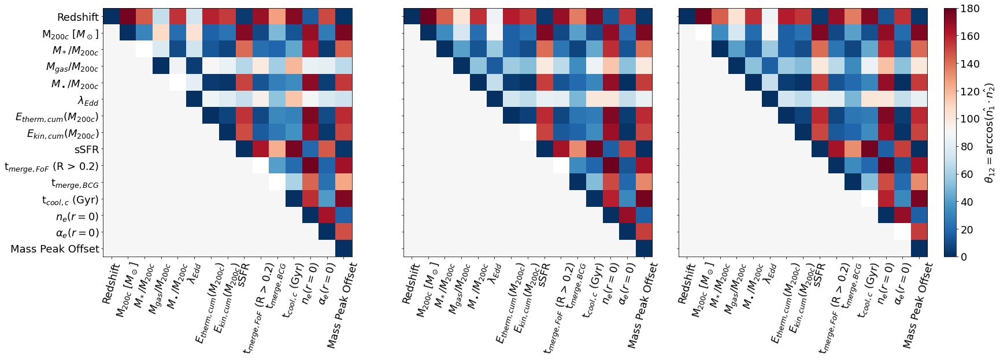

In [116]:
fig, ax = plt.subplots(ncols=3, sharex=True, sharey=True, figsize=(25,9))
for i in range(3):
    plot_correlation_angles(label_human_dict, df, uns[i], fig=fig, ax=ax[i], colorbar=(i == 2))
plt.tight_layout(h_pad=-2, w_pad=-2)
plt.show()

/tmp/ipykernel_19619/1678063315.py:10: RuntimeWarning: invalid value encountered in arccos
  plt.imshow(np.rad2deg(np.arccos(angles)), cmap=cm.RdBu_r, norm=colors.Normalize(0,180))
/tmp/ipykernel_19619/1678063315.py:10: RuntimeWarning: invalid value encountered in arccos
  plt.imshow(np.rad2deg(np.arccos(angles)), cmap=cm.RdBu_r, norm=colors.Normalize(0,180))
/tmp/ipykernel_19619/1678063315.py:10: RuntimeWarning: invalid value encountered in arccos
  plt.imshow(np.rad2deg(np.arccos(angles)), cmap=cm.RdBu_r, norm=colors.Normalize(0,180))
/tmp/ipykernel_19619/1678063315.py:10: RuntimeWarning: invalid value encountered in arccos
  plt.imshow(np.rad2deg(np.arccos(angles)), cmap=cm.RdBu_r, norm=colors.Normalize(0,180))
/tmp/ipykernel_19619/1678063315.py:10: RuntimeWarning: invalid value encountered in arccos
  plt.imshow(np.rad2deg(np.arccos(angles)), cmap=cm.RdBu_r, norm=colors.Normalize(0,180))
/tmp/ipykernel_19619/1678063315.py:10: RuntimeWarning: invalid value encountered in arccos
  pl

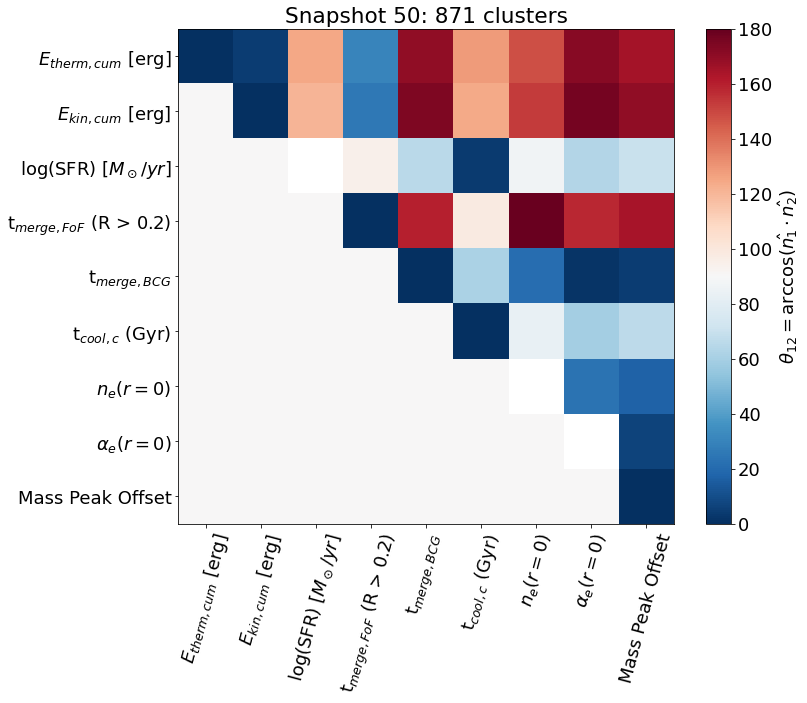

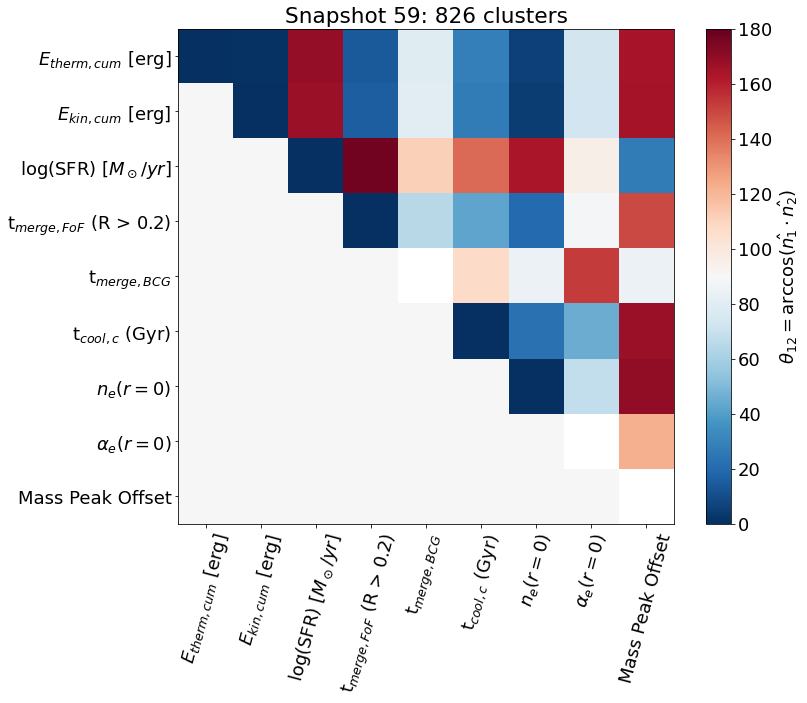

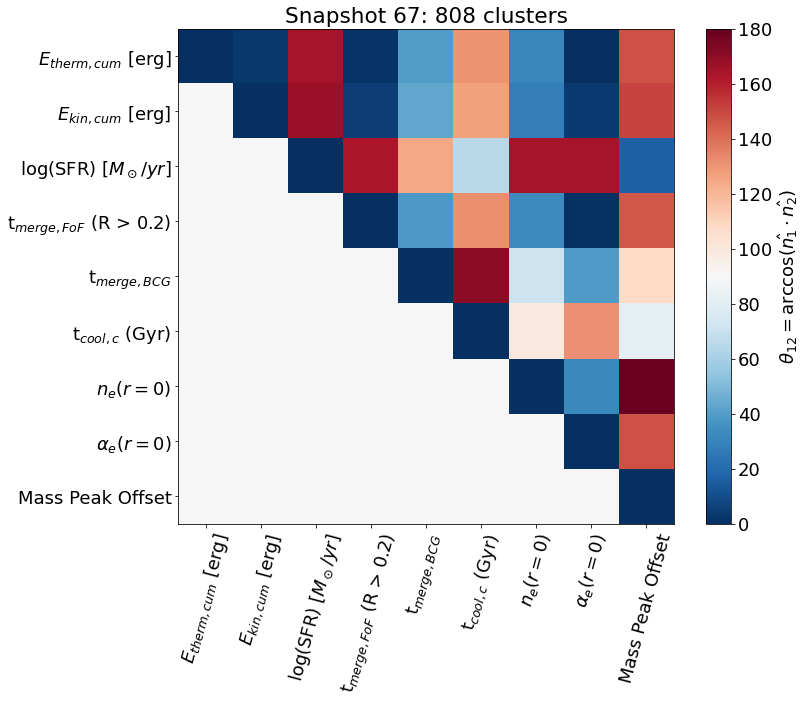

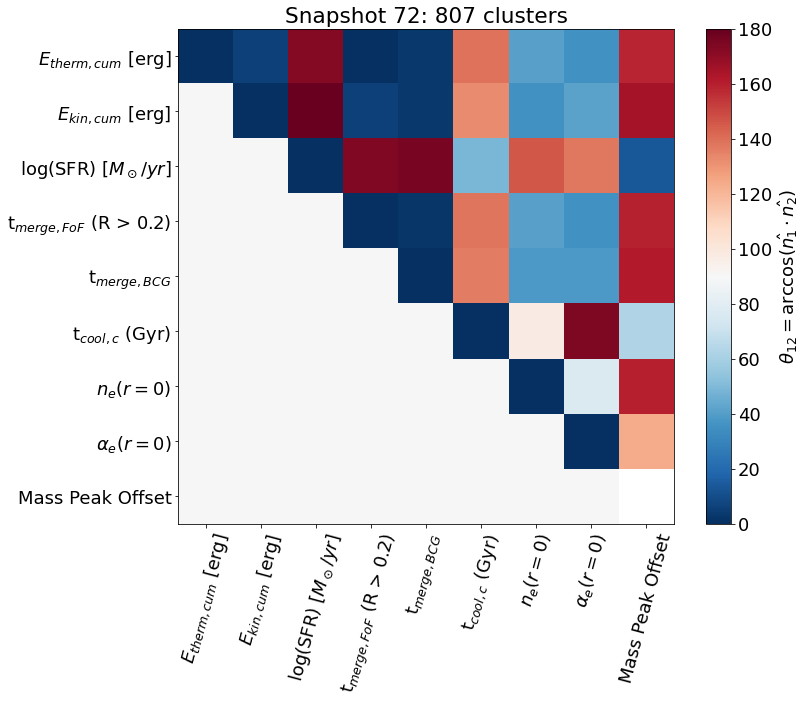

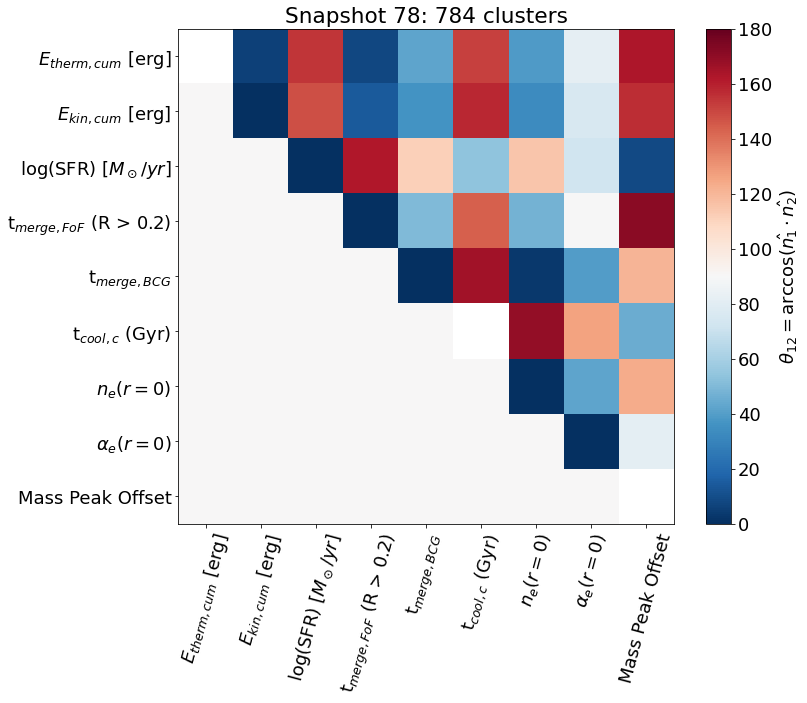

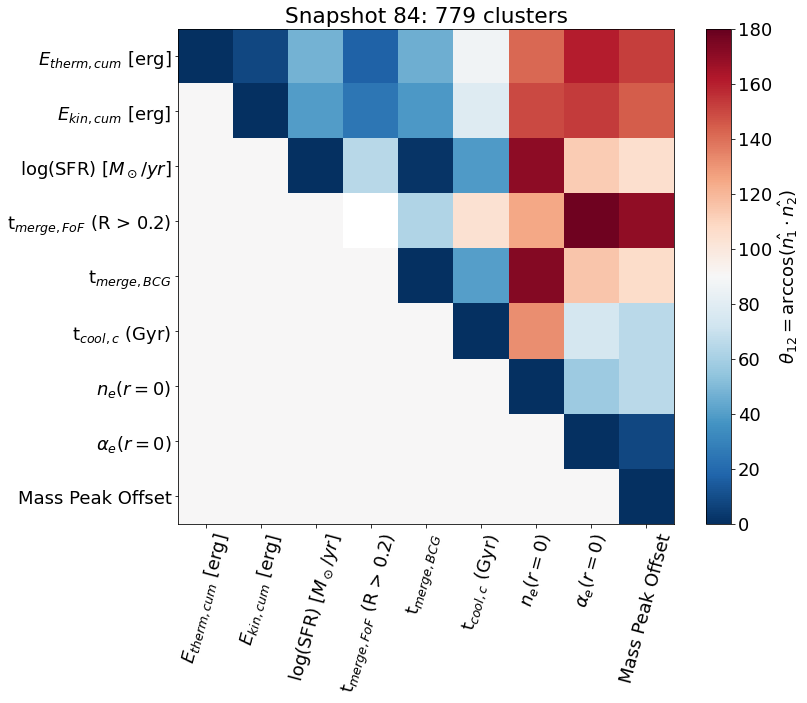

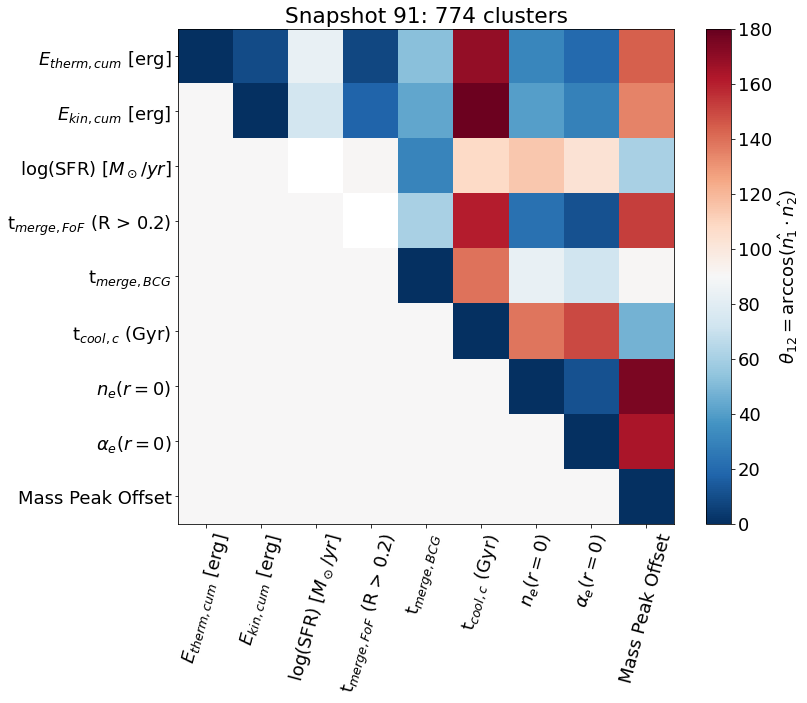

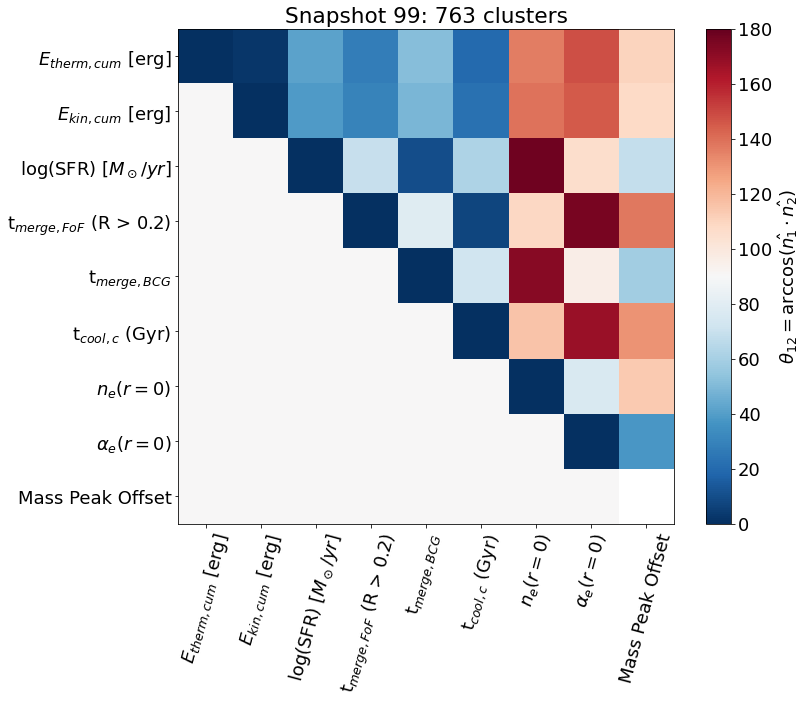

In [39]:
for snapshot in np.unique(df['snapshot_id']):
    angles = np.zeros((len(activity_list), len(activity_list)))
    for i in range(len(activity_list)):
            for j in range(i, len(activity_list)):
                angles[i,j] = relative_angles(df, u, activity_list[i], activity_list[j], snapshot=snapshot)
    #         for j in range(i):
    #             angles[i,j] = np.nan

    fig, ax = plt.subplots( figsize=(12,10))
    plt.imshow(np.rad2deg(np.arccos(angles)), cmap=cm.RdBu_r, norm=colors.Normalize(0,180))
    ticks = [k for k in bh_sfr_merge.values()]
    _ = plt.xticks(np.arange(len(activity_list)), ticks, rotation=75)
    _ = plt.yticks(np.arange(len(activity_list)), ticks)
    plt.colorbar(label=r'$\theta_{12} = \arccos(\hat{n_1} \cdot \hat{n_2})$')
    plt.title('Snapshot %d: %d clusters' % (snapshot, sum(df['snapshot_id'] == snapshot)))
    plt.tight_layout()
    plt.savefig('../../temp/correlation_angles_acitivity_snapshot%d.pdf' % snapshot)            

I don't really know how to interpret the way these correlations are changing with redshift.. this is not a monotonic relationship